In [4]:
import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler
from PIL import Image
from torchvision.transforms import ToPILImage
from shutil import copy2
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle
import torch.nn.functional as F
from sklearn.metrics import precision_score, recall_score, f1_score , confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from torchsummary import summary
from collections import Counter
import torchvision.models as models


In [11]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

# Functions

## Data

### spliting Data

#### Import data for Phase 1 2 3

In [9]:
# Paths
data_dir = "Dataset/Animals/raw-img/"  

output_dir = "split_data/"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")

dataset = datasets.ImageFolder(data_dir)

train_size = int(0.7 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

#### Import dataset 1 for Phase 4

In [ ]:

# Paths
data_dir = "Dataset/Dog_sentiment/Dog Feelings"  

output_dir = "split_data_dog_sentiment/"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")


dataset = datasets.ImageFolder(data_dir)


train_size = int(0.7 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset1_p4, val_dataset1_p4, test_dataset1_p4 = random_split(dataset, [train_size, val_size, test_size])

#### Import dataset 2 for Phase 4

In [ ]:
# Paths
data_dir = "Dataset/dataset2Phase4/"  

output_dir = "split_dataset2Phase4/"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")

dataset = datasets.ImageFolder(data_dir)

train_size = int(0.7 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset2_p4, val_dataset2_p4, test_dataset2_p4 = random_split(dataset, [train_size, val_size, test_size])

### copying test,train and validation into seprated directories

In [10]:
for split_dir in [train_dir, val_dir, test_dir]:
    if not os.path.exists(split_dir):
        os.makedirs(split_dir)

    # Create class subdirectories in each split
    for class_name in dataset.classes:
        class_dir = os.path.join(split_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)

def copy_images(dataset, indices, split_dir):
    for idx in indices:
        img_path, label = dataset.imgs[idx]
        class_name = dataset.classes[label]
        class_dir = os.path.join(split_dir, class_name)

        img_filename = os.path.basename(img_path)
        img_save_path = os.path.join(class_dir, img_filename)

        # Copy the image to the new location
        copy2(img_path, img_save_path)

train_indices = train_dataset.indices
val_indices = val_dataset.indices
test_indices = test_dataset.indices

# Copy images to the corresponding directories
copy_images(dataset, train_indices, train_dir)
copy_images(dataset, val_indices, val_dir)
copy_images(dataset, test_indices, test_dir)

print("Images have been copied to the corresponding directories.")


Images have been copied to the corresponding directories.


### Preprocess Data

#### find std , Mean

In [5]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  
    transforms.ToTensor()
])


dataset = datasets.ImageFolder("./Dataset/Animals/raw-img/", transform=transform)


dataloader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=2)


mean = 0.0
std = 0.0
nb_samples = 0

# Iterate through the DataLoader
for data, _ in dataloader:
    batch_samples = data.size(0)  # Number of images in the batch
    data = data.contiguous().view(batch_samples, data.size(1), -1)  # Reshape to [batch_size, channels, pixels]
    mean += data.mean(2).sum(0)  
    std += data.std(2).sum(0)    
    nb_samples += batch_samples

# Final mean and std per channel
mean /= nb_samples
std /= nb_samples

print(f"Mean: {mean}")
print(f"Std: {std}")



Mean: tensor([0.5177, 0.5003, 0.4125])
Std: tensor([0.2082, 0.2078, 0.2098])


In [54]:
mean = [0.5177, 0.5003, 0.4125]
std = [0.2082, 0.2078, 0.2098]

transform_all = transforms.Compose([
    transforms.Resize(150),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

augmentation_transform = transforms.Compose([ #for phase 3
    transforms.Resize(150),
    transforms.RandomRotation(degrees=45),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.RandomHorizontalFlip(p=0.3),

    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

train_data = datasets.ImageFolder("./split_data/train/",transform=transform_all)
val_data = datasets.ImageFolder("./split_data/val/", transform=transform_all)
test_data = datasets.ImageFolder("./split_data/test/", transform=transform_all)
train_aug_data = datasets.ImageFolder("./split_data/train/", transform=augmentation_transform)


train_dataset, _, _ = random_split(train_data, [int(len(train_data)), 0, 0])
val_dataset, _, _ = random_split(val_data, [int(len(val_data)), 0, 0])
test_dataset, _, _ = random_split(test_data, [int(len(test_data)), 0, 0])
train_aug_dataset, _, _ = random_split(train_aug_data, [int(len(train_aug_data)), 0, 0])


In [ ]:
mean = [0.5177, 0.5003, 0.4125]
std = [0.2082, 0.2078, 0.2098]

transform_all = transforms.Compose([#for phase 4
    transforms.Resize(150),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

train_dataset1_p4 = datasets.ImageFolder("./augmented_train_data_phase4/", transform=transform_all)
val_dataset1_p4 = datasets.ImageFolder("./split_data_dog_sentiment/val/", transform=transform_all)
test_dataset1_p4 = datasets.ImageFolder("./split_data_dog_sentiment/test/", transform=transform_all)


train_dataset1_p4, _, _ = random_split(train_dataset1_p4, [int(len(train_dataset1_p4)), 0, 0])
val_dataset1_p4, _, _ = random_split(val_dataset1_p4, [int(len(val_dataset1_p4)), 0, 0])
test_dataset1_p4, _, _ = random_split(test_dataset1_p4, [int(len(test_dataset1_p4)), 0, 0])



In [8]:
mean = [0.5177, 0.5003, 0.4125]
std = [0.2082, 0.2078, 0.2098]


transform_all = transforms.Compose([#for phase 4
    transforms.Resize(150),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])



train_dataset2_p4 = datasets.ImageFolder("./augmented_train_data_phase4_dataset2/", transform=transform_all)
val_dataset2_p4 = datasets.ImageFolder("./split_dataset2Phase4/val/", transform=transform_all)
test_dataset2_p4 = datasets.ImageFolder("./split_dataset2Phase4/test/", transform=transform_all)



train_dataset2_p4, _, _ = random_split(train_dataset2_p4, [int(len(train_dataset2_p4)), 0, 0])
val_dataset2_p4, _, _ = random_split(val_dataset2_p4, [int(len(val_dataset2_p4)), 0, 0])
test_dataset2_p4, _, _ = random_split(test_dataset2_p4, [int(len(test_dataset2_p4)), 0, 0])



#### Data Loaders

resampling for even distrbution of classes

In [55]:
class_counts = Counter(train_data.targets)
print("Class counts:", class_counts)


Class counts: Counter({0: 3405, 8: 3392, 4: 2128, 1: 1851, 3: 1472, 6: 1318, 9: 1315, 7: 1275, 5: 1138, 2: 1031})


In [56]:
class_sample_counts = np.array([class_counts[i] for i in range(len(class_counts))])
weights = 1. / class_sample_counts
sample_weights = [weights[label] for label in train_data.targets]
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(train_dataset), replacement=True)

In [57]:
batch_size = 32 
num_workers = 4  
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler,shuffle=False, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
train_aug_loader = DataLoader(train_aug_dataset, batch_size=batch_size, sampler=sampler, num_workers=num_workers)

## Train Functions

### default

In [18]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, scheduler=None):
    global training_accuracies, validation_accuracies

    # Tracking learning curves
    training_accuracies = []
    validation_accuracies = []
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss, running_corrects = 0.0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

        epoch_train_loss = running_loss / len(train_loader.dataset)
        epoch_train_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_train_loss)
        training_accuracies.append(epoch_train_acc.item())

        # Validation phase
        model.eval()
        running_val_loss, val_corrects = 0.0, 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                running_val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)

        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        epoch_val_acc = val_corrects.double() / len(val_loader.dataset)

        val_losses.append(epoch_val_loss)
        validation_accuracies.append(epoch_val_acc.item())

        if scheduler:
            current_lr = scheduler.optimizer.param_groups[0]['lr']
            scheduler.step(epoch_val_loss)
        else:
            current_lr = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch + 1}/{num_epochs}, "
              f"Training Accuracy: {epoch_train_acc:.4f}, Validation Accuracy: {epoch_val_acc:.4f}, "
              f"Learning Rate: {current_lr:.6f}")
        print(f"Epoch {epoch + 1}/{num_epochs}, "
              f"Training Loss: {epoch_train_loss:.4f}, Validation Loss: {epoch_val_loss:.4f}")

    return training_accuracies, validation_accuracies, train_losses, val_losses


### With Early Stopping

In [17]:
def train_model_with_early_stopping(model, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience,improvement_threshold=0.001):
    best_val_loss = float('inf')
    no_improvement_epochs = 0
    training_accuracies = []
    validation_accuracies = []
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss, running_corrects = 0.0, 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)
        epoch_train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)
        training_accuracies.append(epoch_acc.item())
        # Validation phase
        model.eval()
        val_corrects = 0
        running_val_loss= 0.0
        val_loss = 0.0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                running_val_loss += loss.item() * inputs.size(0)

        val_acc = val_corrects.double() / len(val_loader.dataset)
        validation_accuracies.append(val_acc.item())
        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
        current_lr = scheduler.optimizer.param_groups[0]['lr']
        print(f'Epoch {epoch + 1}/{num_epochs}, '
              f'Training Accuracy: {epoch_acc:.4f}, Validation Accuracy: {val_acc:.4f},Learning Rate: {current_lr:.6f}')
        print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {running_loss/len(train_loader):.4f}, Validation Loss: {val_loss/len(val_loader):.4f}")

        scheduler.step(val_loss)
            # Early Stopping Logic
        if best_val_loss - (val_loss) > improvement_threshold:
            best_val_loss = val_loss
            no_improvement_epochs = 0
            # Save the best model
            # torch.save(Optimizedmodel.state_dict(), 'best_model.pth')
            # print("Validation loss improved. Saving the model...")
        else:
            no_improvement_epochs += 1
            print(f"No improvement for {no_improvement_epochs} epoch(s).")
    
        if no_improvement_epochs >= patience:
            print("Early stopping triggered. Stopping training.")
            break


    return training_accuracies, validation_accuracies , train_losses, val_losses


## Trainable Param

In [3]:
def trainableParam(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"Total Parameters: {total_params}")
    print(f"Trainable Parameters: {trainable_params}")

## Plot Results

### Plot Learning Curves

In [20]:
def plot_learning_curves(training_accuracies, validation_accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(training_accuracies, label='Training Accuracy')
    plt.plot(validation_accuracies, label='Validation Accuracy')
    plt.title('Learning Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid()
    plt.show()

### Plot Confusion Matrix

In [21]:
def plot_confusion_matrix(model, val_loader, class_names):
    all_preds, all_labels = [], []
    model.eval()
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    cm = confusion_matrix(all_labels, all_preds, labels=range(len(class_names)))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
    plt.title('Confusion Matrix')
    plt.show()


### Plot ROC Curve

In [22]:

def plot_roc_curve(model, val_loader, class_names):
    y_score, y_true = [], []
    model.eval()
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = F.softmax(model(inputs), dim=1)  # Get probabilities
            y_score.extend(outputs.cpu().numpy())
            y_true.extend(labels.cpu().numpy())

    y_score = np.array(y_score)
    y_true = np.array(y_true)
    n_classes = len(class_names)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        y_bin = (y_true == i).astype(int)
        fpr[i], tpr[i], _ = roc_curve(y_bin, y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 6))
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green', 'purple'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, 
                 label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

 ### Plot the training and validation losses

In [23]:
def plot_training_validation_losses(train_losses, val_losses, num_epochs):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid()
    plt.show()

### Evaluate Model

In [24]:
def evaluate_model(model, test_loader, device):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []
    
    with torch.no_grad():  # Disable gradient computation for testing
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)  # Get the predicted class
            
            all_preds.extend(preds.cpu().numpy())  #
            all_labels.extend(labels.cpu().numpy()) 
    
    # Calculate Precision, Recall, F1-Score
    precision = precision_score(all_labels, all_preds, average='weighted')  # 'weighted' for multi-class
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1-Score: {f1:.2f}')


### Visualize predictions with class names

In [25]:
# Function to unnormalize the image
def imshow(img):
    img = img / 2 + 0.5  # Unnormalize
    npimg = img.cpu().numpy()  # Convert to NumPy array (move to CPU if necessary)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


def visualize_predictions_with_class_names(model, test_loader, device, class_names, num_images=10):
    model.eval()  
    data_iter = iter(test_loader)  
    images, labels = next(data_iter)  
    images, labels = images.to(device), labels.to(device)

    outputs = model(images) 
    _, preds = torch.max(outputs, 1)  

    num_images = min(num_images, len(images))

    plt.figure(figsize=(15, 8))
    for i in range(num_images):
        ax = plt.subplot(2, (num_images + 1) // 2, i + 1)  # Place images in 2 rows
        imshow(images[i])  # Show image
        ax.set_title(f"True: {class_names[labels[i].item()]}\nPred: {class_names[preds[i].item()]}")
        ax.axis('off')  # Hide axes for a cleaner view
    plt.tight_layout()
    plt.show()




# Phase 1

## CNN Architecture

In [28]:
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  
########

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1, groups=16),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

##########            

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

##########
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

##########

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),


            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, groups=256),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),
##########
        )
        self.classifier = nn.Sequential(
            nn.Flatten(), 
            nn.Linear(256 * 2 * 2, 1024), 
            nn.ReLU(),
            nn.Linear(1024, 10) 
        )

    def forward(self, x):
        x = self.features(x)
        
        x = self.classifier(x)
        return x

## Initialize and Train model

In [29]:
# Initialize model
model = CustomCNN()
model = model.to(device)
summary(model, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [82]:
num_epochs = 30
learning_rate = 0.1
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=learning_rate,weight_decay=0.005)  
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.05, patience=2,verbose=True)

In [83]:
training_accuracies, validation_accuracies, train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, scheduler)


Epoch 1/30, Training Accuracy: 0.3284, Validation Accuracy: 0.3982, Learning Rate: 0.100000
Epoch 1/30, Training Loss: 1.9186, Validation Loss: 1.7297
Epoch 2/30, Training Accuracy: 0.4647, Validation Accuracy: 0.4291, Learning Rate: 0.100000
Epoch 2/30, Training Loss: 1.5600, Validation Loss: 1.6127
Epoch 3/30, Training Accuracy: 0.5447, Validation Accuracy: 0.5950, Learning Rate: 0.100000
Epoch 3/30, Training Loss: 1.3194, Validation Loss: 1.2066
Epoch 4/30, Training Accuracy: 0.5991, Validation Accuracy: 0.5319, Learning Rate: 0.100000
Epoch 4/30, Training Loss: 1.1654, Validation Loss: 1.4433
Epoch 5/30, Training Accuracy: 0.6308, Validation Accuracy: 0.5823, Learning Rate: 0.100000
Epoch 5/30, Training Loss: 1.0820, Validation Loss: 1.1939
Epoch 6/30, Training Accuracy: 0.6497, Validation Accuracy: 0.5529, Learning Rate: 0.100000
Epoch 6/30, Training Loss: 1.0198, Validation Loss: 1.3144
Epoch 7/30, Training Accuracy: 0.6620, Validation Accuracy: 0.5560, Learning Rate: 0.100000
Ep

## Results

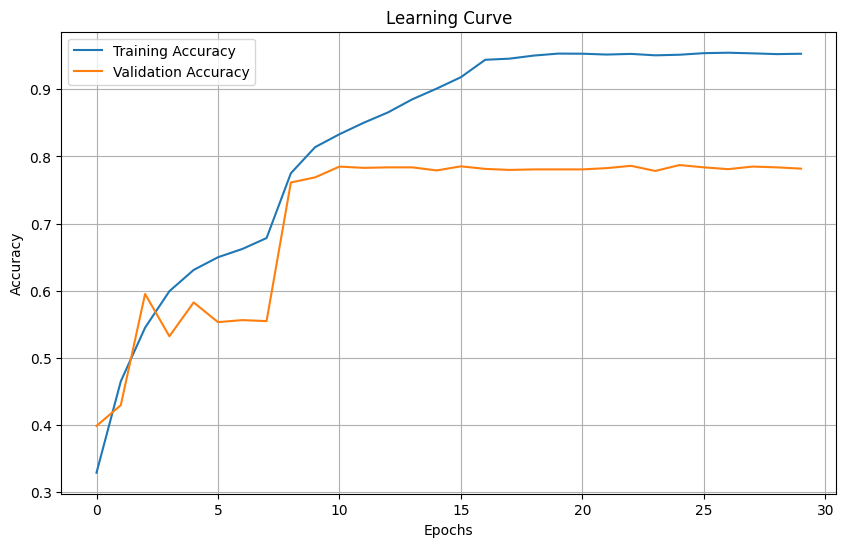

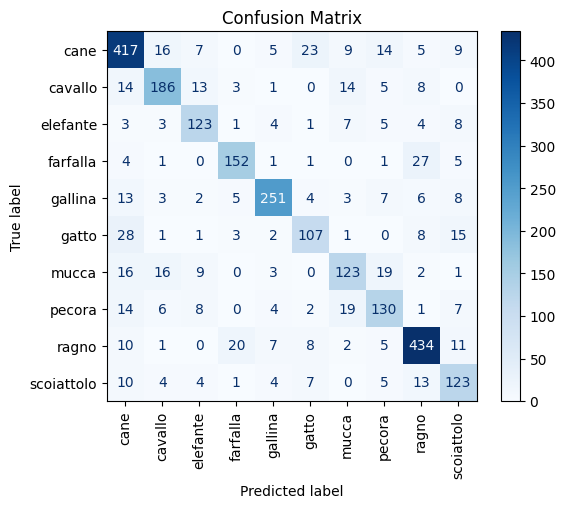

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000001F82D7D5260>
Traceback (most recent call last):
  File "C:\Users\Kia\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1604, in __del__
    self._shutdown_workers()
  File "C:\Users\Kia\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1562, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


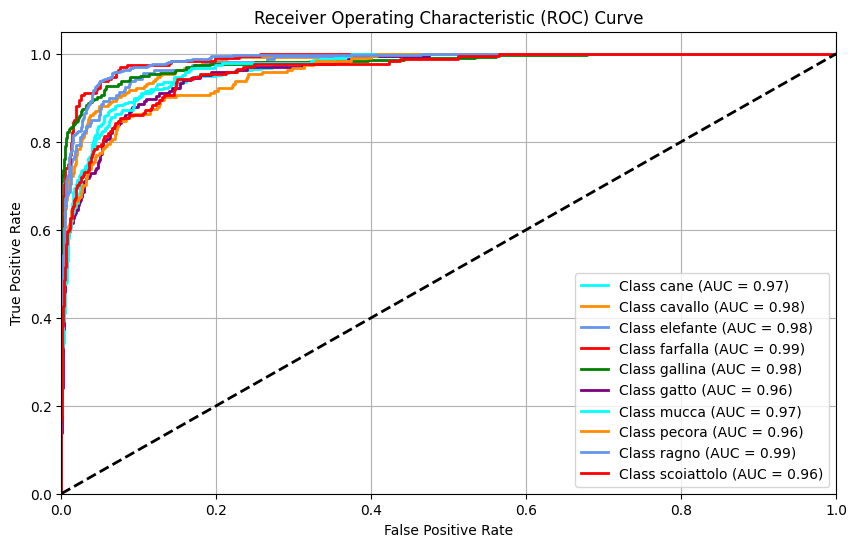

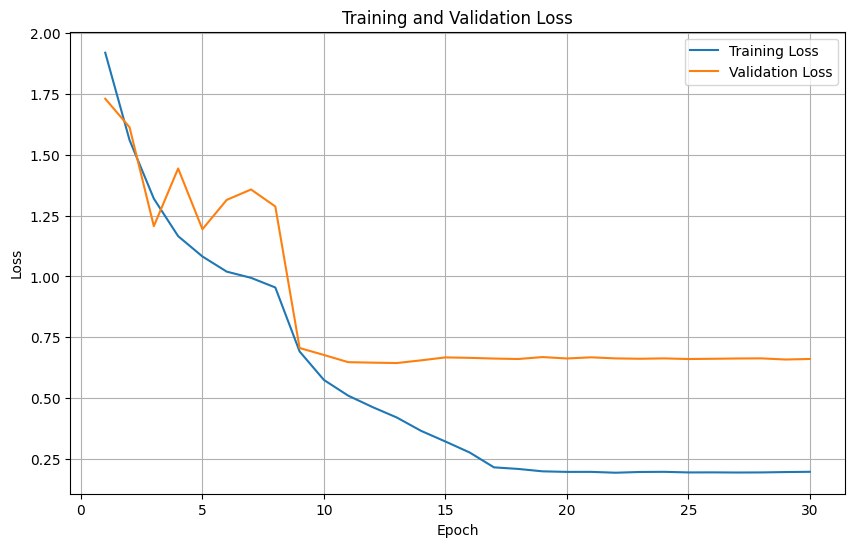

In [84]:
class_names = train_data.classes

plot_learning_curves(training_accuracies, validation_accuracies)
plot_confusion_matrix(model, val_loader, class_names)
plot_roc_curve(model, val_loader, class_names)
plot_training_validation_losses(train_losses, val_losses, num_epochs)


In [85]:
precision, recall, f1 = evaluate_model(model, test_loader, device)
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1-Score: {f1:.4f}')


Precision: 0.7698
Recall: 0.7684
F1-Score: 0.7684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5178571..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48189062..1.7241396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5075778..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.47332823..1.6617647].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.55038965..1.8112855].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.7677125]

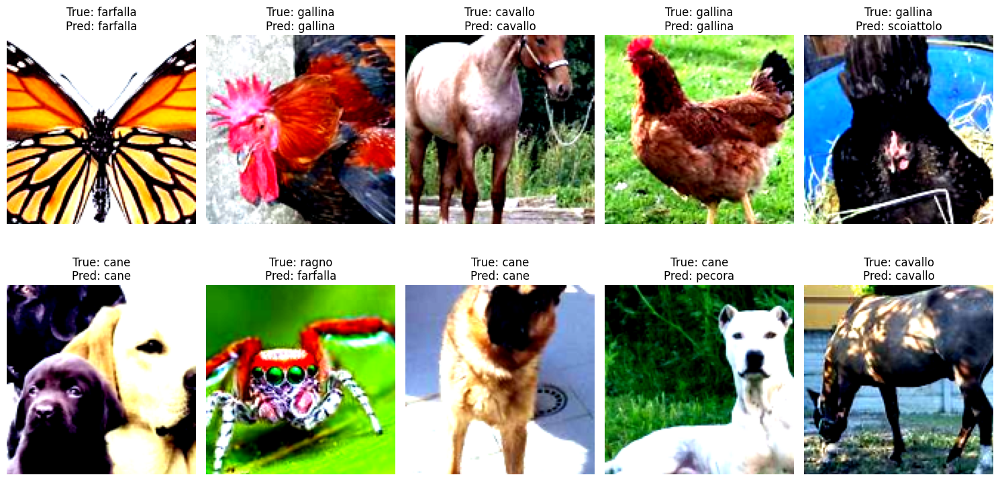

In [86]:
class_names = train_data.classes 
visualize_predictions_with_class_names(model, test_loader, device, class_names, num_images=10)

### Earlier Results

Accuracy Documention:
cnn1 1050562
lr:0.001 epoch:10  Batch:32 --- train:93 val:52
lr:0.01  epoch20   Batch:32 --- train: 18 val 17
lr:0.001 epoch20   Batch:32 --- train: 90  val 50
lr:0.001 epoch20   Batch:64 --- train: 99  val 54 

cnn2 525922
lr:0.001 epoch20   Batch:64 --- train: 96  val 51

cnn3 1312342 size 256 kheyli bad asan tekoon nemikhord. 5 ta layer
lr:0.001 epoch20   Batch:64 --- train:99   val 79 test 79

cnn3 1374406 6 ta layer
lr:0.001 epoch20   Batch:64 --- train: 98   val 75 test 75
cnn3 1312342 size 256 kheyli bad asan tekoon nemikhord. 5 ta layer
lr:0.001 epoch20   Batch:125 --- train:9999   val 81 test 81
lr:0.001 epoch20   Batch:250 --- train:100   val 81  test 82


cnn4: with kernel sharing and weight sharing
lr:0.001 epoch 7   Batch:125 --- train:81   val 50  hyperparameter problem. validation drop
lr:0.1e-4 epoch 20   Batch:125 --- train:   val 59  hyperparameter problem. validation drop
cnn5: fewer conv layer
lr:0.001 epoch 20   Batch:125 --- train: 99   val 78  test 80 

mobilenet:
lr:0.001 epoch 20   Batch:125 --- train: 99   val 76  test 76
after changing the preprocess
lr:0.001 epoch 20   Batch:64 --- train: 99   val 76  test 76
sgd vs adam 75 , 71
lr:0.001 epoch 30   Batch:128 --- train: 93   val 73  test 74
lr: dynamic epoch 50 batch 64 train 99 val 78 test 78
lr: dynamic epoch 20 batch 128 train 99 val 70 test 70 Leaky Relu
lr: dynamic epoch 20 batch 64 train 99 val 72 test 72  Relu
lr: dynamic epoch 20 batch 32 train99  val 75  test 75   Relu
lr: dynamic epoch 20 batch 32 train 78  val 68  test 70   Relu weight decay .01
lr: dynamic epoch 30 batch 32 train 95  val 76  test 78   Relu weight decay .005

In [90]:
torch.save(model.state_dict(), "CNNPhase1.pth")
del model
del optimizer
torch.cuda.empty_cache()

# Phase 2

## CNN Architecture

In [26]:

class OptimizedCNN(nn.Module):
    def __init__(self):
        super(OptimizedCNN, self).__init__()
        
        # Convolutional Layers with consistent kernel and weight sharing
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  
########

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1, groups=16),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

##########            

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

##########
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

##########

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),


            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, groups=256),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),
##########
        )
        
        # Global Average Pooling followed by a classifier
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1), 
            nn.Flatten(), 
            nn.Linear(256, 10)             
)
    def forward(self, x):
        # Feature extraction
        x = self.features(x)
        
        # Apply Global Average Pooling (output shape: [batch_size, 512, 1, 1])
        x = self.classifier(x)
        return x



## Initialize and Train model

In [24]:
# Initialize model
Optimizedmodel = OptimizedCNN()
Optimizedmodel = Optimizedmodel.to(device)
summary(Optimizedmodel, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [101]:
num_epochs = 30
learning_rate = 0.1
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(Optimizedmodel.parameters(), lr=learning_rate,weight_decay=0.005) 
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)


In [102]:
Optimized_training_accuracies, Optimized_validation_accuracies, Optimized_train_losses, Optimized_val_losses = train_model(Optimizedmodel, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler)

Epoch 1/30, Training Accuracy: 0.3739, Validation Accuracy: 0.4352, Learning Rate: 0.100000
Epoch 1/30, Training Loss: 1.8009, Validation Loss: 1.6471
Epoch 2/30, Training Accuracy: 0.5207, Validation Accuracy: 0.5365, Learning Rate: 0.100000
Epoch 2/30, Training Loss: 1.3926, Validation Loss: 1.3524
Epoch 3/30, Training Accuracy: 0.5967, Validation Accuracy: 0.4933, Learning Rate: 0.100000
Epoch 3/30, Training Loss: 1.1865, Validation Loss: 1.5220
Epoch 4/30, Training Accuracy: 0.6413, Validation Accuracy: 0.5457, Learning Rate: 0.100000
Epoch 4/30, Training Loss: 1.0632, Validation Loss: 1.3556
Epoch 5/30, Training Accuracy: 0.6742, Validation Accuracy: 0.5300, Learning Rate: 0.100000
Epoch 5/30, Training Loss: 0.9772, Validation Loss: 1.3951
Epoch 6/30, Training Accuracy: 0.6838, Validation Accuracy: 0.4631, Learning Rate: 0.100000
Epoch 6/30, Training Loss: 0.9452, Validation Loss: 1.5904
Epoch 7/30, Training Accuracy: 0.7566, Validation Accuracy: 0.7440, Learning Rate: 0.050000
Ep

## Results

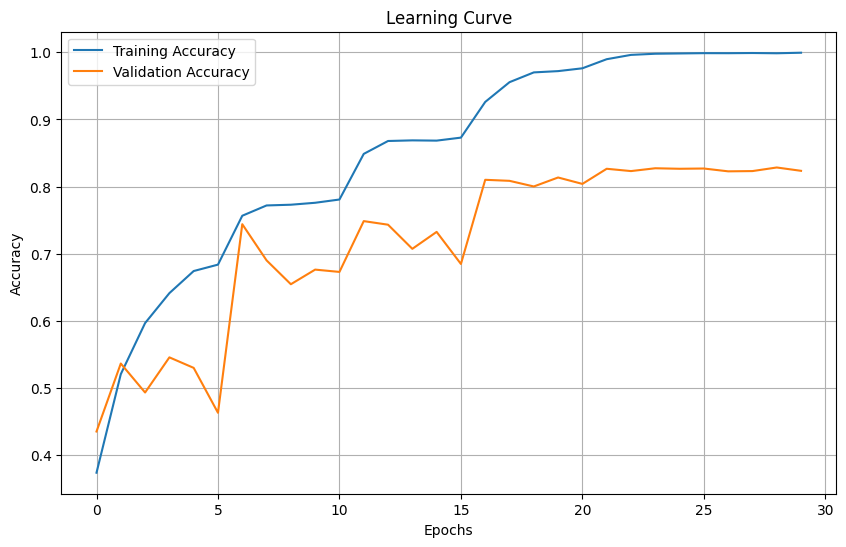

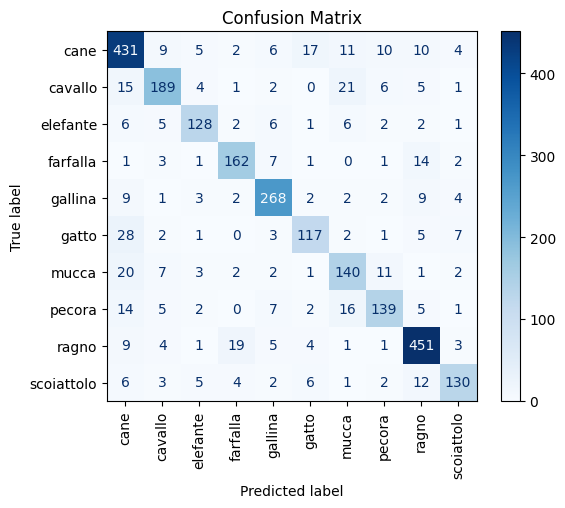

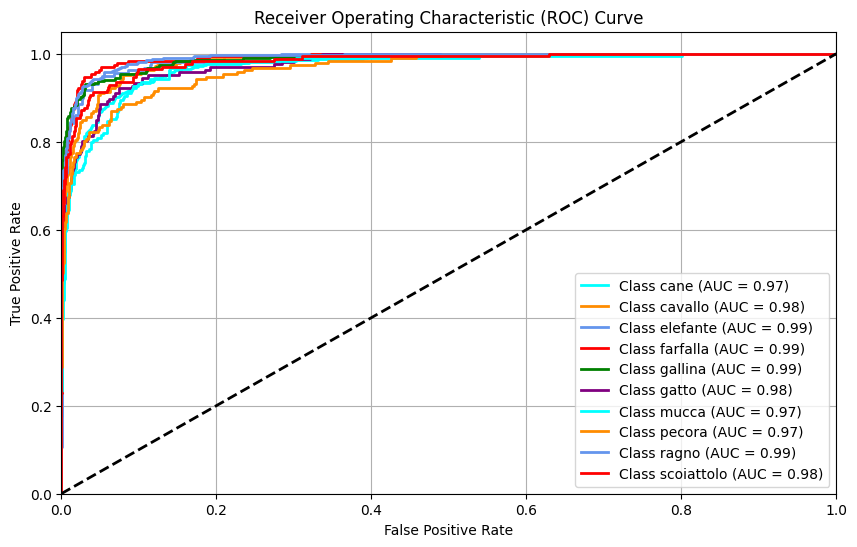

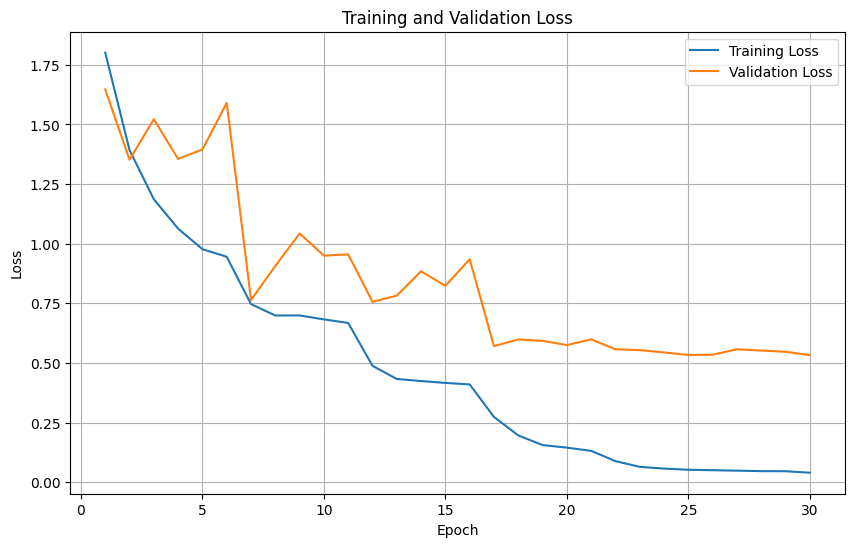

In [103]:
class_names = train_data.classes

plot_learning_curves(Optimized_training_accuracies, Optimized_validation_accuracies)
plot_confusion_matrix(Optimizedmodel, val_loader, class_names)
plot_roc_curve(Optimizedmodel, val_loader, class_names)
plot_training_validation_losses(Optimized_train_losses, Optimized_val_losses, num_epochs)


In [104]:
evaluate_model(Optimizedmodel, test_loader, device)

Precision: 0.8120
Recall: 0.8104
F1-Score: 0.8101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5178571..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48189062..1.7241396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5075778..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.47332823..1.6617647].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.55038965..1.8112855].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.7677125]

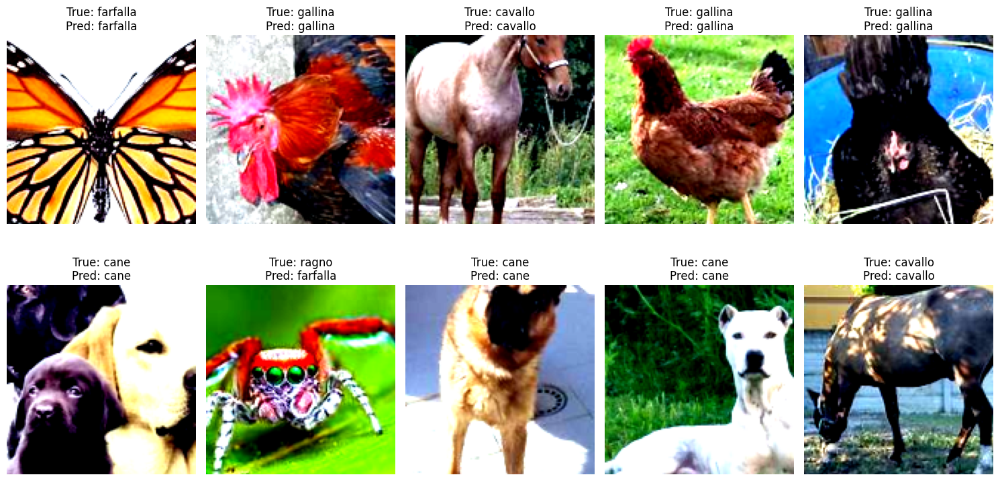

In [105]:
class_names = train_data.classes 
visualize_predictions_with_class_names(Optimizedmodel, test_loader, device, class_names, num_images=10)

### Earlier Results

mobilenet:
lr:0.001 epoch 20   Batch:125 --- train: 99   val 76  test 76 SGD
dynamic lr epoch 50 batch:64 train: 99   val 78  test 78 SGD
dynamic lr epoch 30 batch:32 train: 99   val 82  test 81 SGD weight decay 0.005


In [25]:
torch.save(Optimizedmodel.state_dict(), "Optimizedmodel.pth")
del Optimizedmodel
del optimizer
torch.cuda.empty_cache()

# Phase 3

## Phase1 Model

### CNN Architecture

Dropout + augmentation + Early Stopping 

In [71]:
class OptimizedCNNPhase1(nn.Module):
    def __init__(self):
        super(OptimizedCNNPhase1, self).__init__()
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  
########

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1, groups=16),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

##########            

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

##########
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

##########

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),


            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, groups=256),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),
##########
        )
        
        self.classifier = nn.Sequential(
            nn.Flatten(), 
            nn.Dropout(p=0.25),
            nn.Linear(256 * 2 * 2, 1024), 
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1024, 10) 
        )
    #     self.classifier = nn.Sequential(
    #     nn.Flatten(),
    #     nn.Dropout(p=0.25),
    #     nn.Linear(256 * 2 * 2, 800),
    #     nn.ReLU(),
    #     nn.Dropout(p=0.25),
    #     nn.Linear(800, 400),
    #     nn.ReLU(),
    #     nn.Linear(400, 10)
    # )
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

### Initialize and Train Model

In [72]:
OptimizedCNNPhase1 = OptimizedCNNPhase1()
OptimizedCNNPhase1 = OptimizedCNNPhase1.to(device)
summary(OptimizedCNNPhase1, input_size=(3, 128, 128), device=str(device))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
         LeakyReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
         LeakyReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
         LeakyReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
        LeakyReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
        LeakyReLU-14           [-1, 32,

In [21]:
torch.cuda.empty_cache()
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase1.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase1_training_accuracies, OptimizedCNNPhase1_validation_accuracies , OptimizedCNNPhase1_train_losses, OptimizedCNNPhase1_val_losses =train_model_with_early_stopping(OptimizedCNNPhase1, train_aug_loader, val_loader , criterion, optimizer, num_epochs,scheduler,patience)


C:\Users\Kia\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/100, Training Accuracy: 0.2626, Validation Accuracy: 0.3065,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 66.7976, Validation Loss: 1.9740
Epoch 2/100, Training Accuracy: 0.3311, Validation Accuracy: 0.4031,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 61.4636, Validation Loss: 1.7790
Epoch 3/100, Training Accuracy: 0.3886, Validation Accuracy: 0.4654,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 57.2601, Validation Loss: 1.5616
Epoch 4/100, Training Accuracy: 0.4315, Validation Accuracy: 0.5113,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 53.4826, Validation Loss: 1.4402
Epoch 5/100, Training Accuracy: 0.4715, Validation Accuracy: 0.5010,Learning Rate: 0.200000
Epoch 5/100, Training Loss: 49.5160, Validation Loss: 1.4488
No improvement for 1 epoch(s).
Epoch 6/100, Training Accuracy: 0.5056, Validation Accuracy: 0.5877,Learning Rate: 0.200000
Epoch 6/100, Training Loss: 46.1324, Validation Loss: 1.2294
Epoch 7/100, Training Accuracy: 0.5410, Validation 

### Results

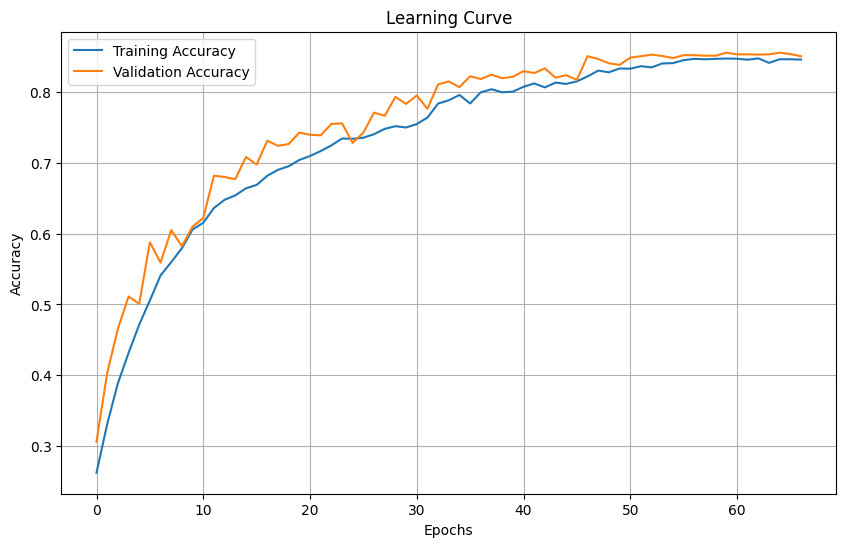

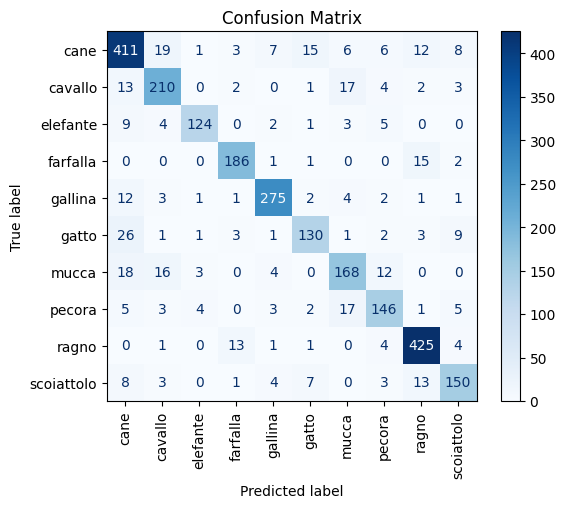

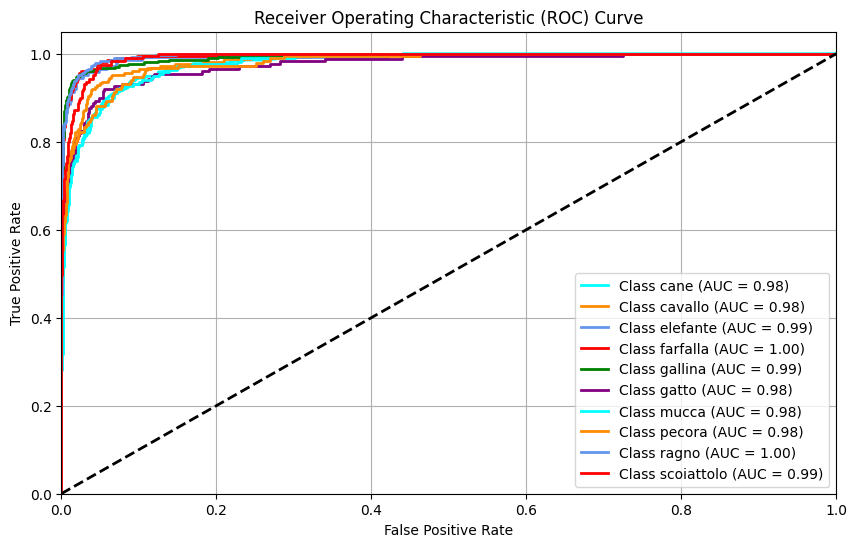

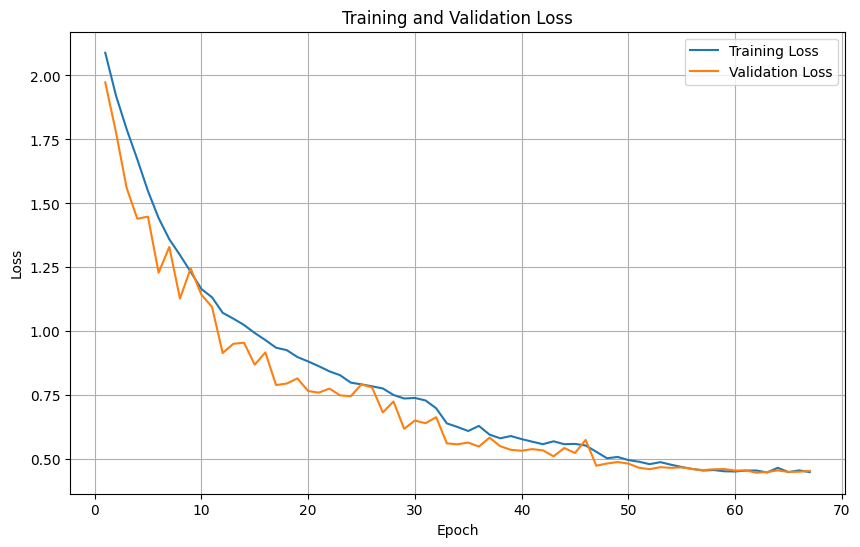

In [32]:
class_names = test_loader.dataset.dataset.classes  
plot_learning_curves(OptimizedCNNPhase1_training_accuracies, OptimizedCNNPhase1_validation_accuracies)
plot_confusion_matrix(OptimizedCNNPhase1, val_loader, class_names)
plot_roc_curve(OptimizedCNNPhase1, val_loader, class_names)
plot_training_validation_losses(OptimizedCNNPhase1_train_losses, OptimizedCNNPhase1_val_losses, 67)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32776785..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.5934205].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46476585..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40222222..1.3247709].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5332649..1.7067103].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5418272..1.5902046].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4390787..1.82]

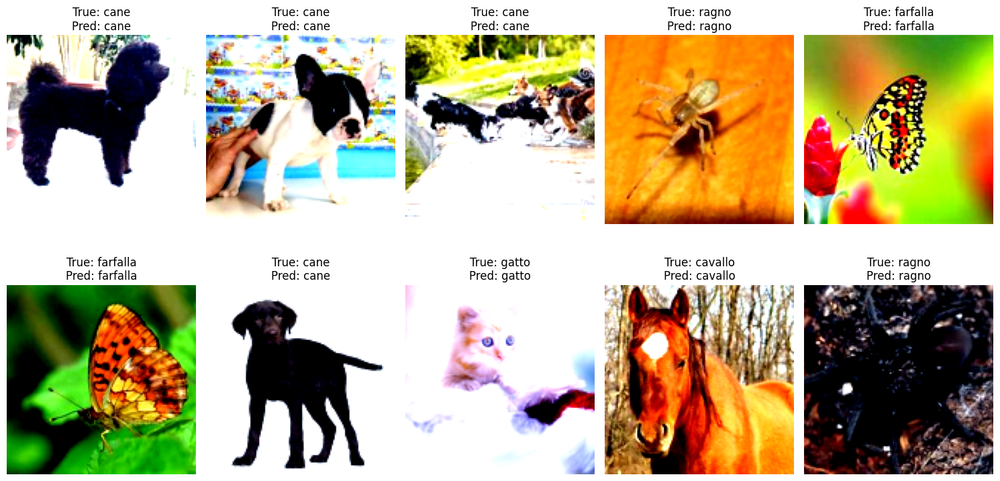

In [33]:
class_names = test_loader.dataset.dataset.classes  
visualize_predictions_with_class_names(OptimizedCNNPhase1, test_loader, device, class_names, num_images=10)

In [34]:
evaluate_model(OptimizedCNNPhase1, test_loader, device)

Precision: 0.84
Recall: 0.84
F1-Score: 0.84


In [42]:
torch.save(OptimizedCNNPhase1.state_dict(), "OptimizedCNNPhase1.pth")
del OptimizedCNNPhase1
del optimizer
torch.cuda.empty_cache()

### Check other hyper parameters

#### With Adam optimizer

In [18]:
torch.cuda.empty_cache()
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
optimizer=optim.Adam(OptimizedCNNPhase1.parameters(), lr=learning_rate)   # Momentum terms for running averageseps=1e-8)  # Small value to prevent division by zeroscheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase1_training_accuracies, OptimizedCNNPhase1_validation_accuracies , OptimizedCNNPhase1_train_losses, OptimizedCNNPhase1_val_losses =train_model_with_early_stopping(OptimizedCNNPhase1, train_aug_loader, val_loader , criterion, optimizer, num_epochs,scheduler,patience)

Epoch 1/100, Training Accuracy: 0.1867, Validation Accuracy: 0.1697,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 76.5808, Validation Loss: 4163086514.7059
Epoch 2/100, Training Accuracy: 0.1908, Validation Accuracy: 0.1697,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 71.2855, Validation Loss: 20969037227.8017
No improvement for 1 epoch(s).
Epoch 3/100, Training Accuracy: 0.1825, Validation Accuracy: 0.1849,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 71.2364, Validation Loss: 30035912.8391
Epoch 4/100, Training Accuracy: 0.1892, Validation Accuracy: 0.1697,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 71.1950, Validation Loss: 7057677203.2686
No improvement for 1 epoch(s).
Epoch 5/100, Training Accuracy: 0.1841, Validation Accuracy: 0.1704,Learning Rate: 0.200000
Epoch 5/100, Training Loss: 71.3689, Validation Loss: 25293339875.4606
No improvement for 2 epoch(s).
Epoch 6/100, Training Accuracy: 0.1869, Validation Accuracy: 0.1697,Learning Rate: 0.200000
Epoch

#### Only weight decay

In [38]:
torch.cuda.empty_cache()
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase1.parameters(), lr=learning_rate,weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase1_training_accuracies, OptimizedCNNPhase1_validation_accuracies , OptimizedCNNPhase1_train_losses, OptimizedCNNPhase1_val_losses =train_model_with_early_stopping(OptimizedCNNPhase1, train_aug_loader, val_loader , criterion, optimizer, num_epochs,scheduler,patience)


C:\Users\Kia\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/100, Training Accuracy: 0.2562, Validation Accuracy: 0.3053,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 67.2448, Validation Loss: 1.9906
Epoch 2/100, Training Accuracy: 0.3415, Validation Accuracy: 0.4016,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 60.1612, Validation Loss: 1.7671
Epoch 3/100, Training Accuracy: 0.4035, Validation Accuracy: 0.4348,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 55.1205, Validation Loss: 1.6896
Epoch 4/100, Training Accuracy: 0.4421, Validation Accuracy: 0.5078,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 51.5105, Validation Loss: 1.4382
Epoch 5/100, Training Accuracy: 0.4819, Validation Accuracy: 0.5258,Learning Rate: 0.200000
Epoch 5/100, Training Loss: 48.3536, Validation Loss: 1.3628
Epoch 6/100, Training Accuracy: 0.5186, Validation Accuracy: 0.5483,Learning Rate: 0.200000
Epoch 6/100, Training Loss: 45.0257, Validation Loss: 1.3236
Epoch 7/100, Training Accuracy: 0.5443, Validation Accuracy: 0.5774,Learning Rate:

#### Only momentum

In [41]:
torch.cuda.empty_cache()
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase1.parameters(), lr=learning_rate,momentum=0.99)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase1_training_accuracies, OptimizedCNNPhase1_validation_accuracies , OptimizedCNNPhase1_train_losses, OptimizedCNNPhase1_val_losses =train_model_with_early_stopping(OptimizedCNNPhase1, train_aug_loader, val_loader , criterion, optimizer, num_epochs,scheduler,patience)


C:\Users\Kia\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/100, Training Accuracy: 0.1866, Validation Accuracy: 0.1865,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 71.2786, Validation Loss: 2.2288
Epoch 2/100, Training Accuracy: 0.1848, Validation Accuracy: 0.1716,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 71.0727, Validation Loss: 2.2375
No improvement for 1 epoch(s).
Epoch 3/100, Training Accuracy: 0.1847, Validation Accuracy: 0.1716,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 71.1669, Validation Loss: 2.2458
No improvement for 2 epoch(s).
Epoch 4/100, Training Accuracy: 0.1864, Validation Accuracy: 0.1154,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 71.0731, Validation Loss: 2.2441
No improvement for 3 epoch(s).
Epoch 5/100, Training Accuracy: 0.1847, Validation Accuracy: 0.1865,Learning Rate: 0.100000
Epoch 5/100, Training Loss: 70.6617, Validation Loss: 2.2281
Epoch 6/100, Training Accuracy: 0.1868, Validation Accuracy: 0.1716,Learning Rate: 0.100000
Epoch 6/100, Training Loss: 70.7412, Validation Lo

## Phase2 Model


### CNN Architecture

Dropout + augmentation + Early Stopping 

In [51]:
import torch
import torch.nn as nn

class OptimizedCNNPhase2(nn.Module):
    def __init__(self):
        super(OptimizedCNNPhase2, self).__init__()
    
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=5, stride=1, padding=2),  
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  
########

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1, groups=16),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 32, kernel_size=1),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

##########            

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1, groups=32),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 64, kernel_size=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

##########
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, groups=64),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

##########

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, groups=128),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),


            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, groups=256),  # Depthwise
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),             
            nn.Conv2d(256, 256, kernel_size=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),
##########
        )
        
        # Global Average Pooling followed by a classifier
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),   # Global Average Pooling
            nn.Flatten(), #Flatten to (batch_size, num_features)
            nn.Dropout(p=0.5),  #
            nn.Linear(256, 10)             # Softmax activation to output class probabilities
)
        
    def forward(self, x):
        # Feature extraction
        x = self.features(x)
        x = self.classifier(x)
        return x


### Initialize and Train model

In [52]:
OptimizedCNNPhase2 = OptimizedCNNPhase2()
OptimizedCNNPhase2 = OptimizedCNNPhase2.to(device)
summary(OptimizedCNNPhase2, input_size=(3, 128, 128), device=str(device))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [44]:
patience=5
num_epochs = 70
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.parameters(), lr=learning_rate, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase2_training_accuracies, OptimizedCNNPhase2_validation_accuracies, OptimizedCNNPhase2_train_losses, OptimizedCNNPhase2_val_losses=train_model_with_early_stopping(OptimizedCNNPhase2, train_aug_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/70, Training Accuracy: 0.2741, Validation Accuracy: 0.3439,Learning Rate: 0.200000
Epoch 1/70, Training Loss: 66.2169, Validation Loss: 1.8484
Validation loss improved. Saving the model...
Epoch 2/70, Training Accuracy: 0.3963, Validation Accuracy: 0.4910,Learning Rate: 0.200000
Epoch 2/70, Training Loss: 55.6108, Validation Loss: 1.4681
Validation loss improved. Saving the model...
Epoch 3/70, Training Accuracy: 0.4650, Validation Accuracy: 0.4543,Learning Rate: 0.200000
Epoch 3/70, Training Loss: 49.7577, Validation Loss: 1.6454
No improvement for 1 epoch(s).
Epoch 4/70, Training Accuracy: 0.5056, Validation Accuracy: 0.5678,Learning Rate: 0.200000
Epoch 4/70, Training Loss: 45.5368, Validation Loss: 1.2235
Validation loss improved. Saving the model...
Epoch 5/70, Training Accuracy: 0.5446, Validation Accuracy: 0.5701,Learning Rate: 0.200000
Epoch 5/70, Training Loss: 42.3974, Validation Loss: 1.2721
No improvement for 1 epoch(s).
Epoch 6/70, Training Accuracy: 0.5752, Valida

### Results

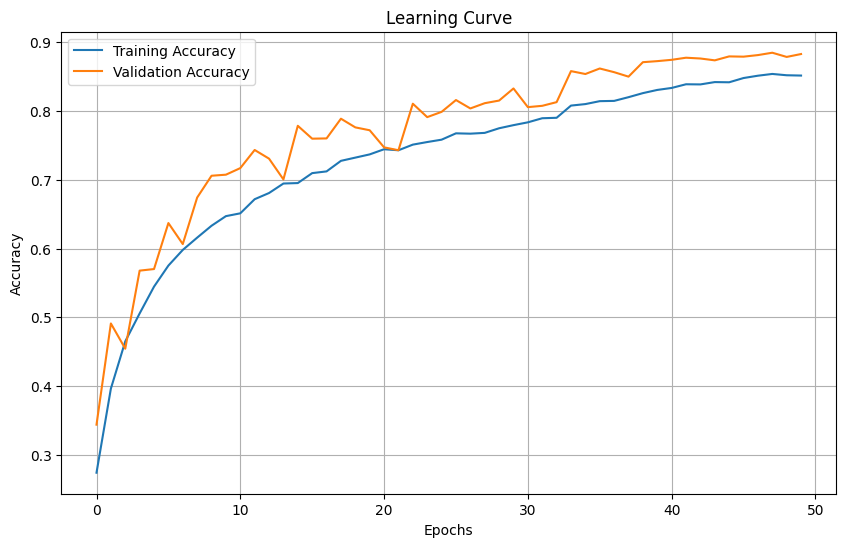

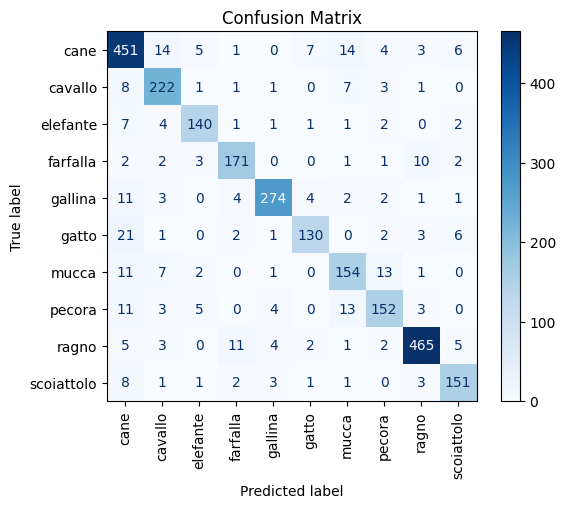

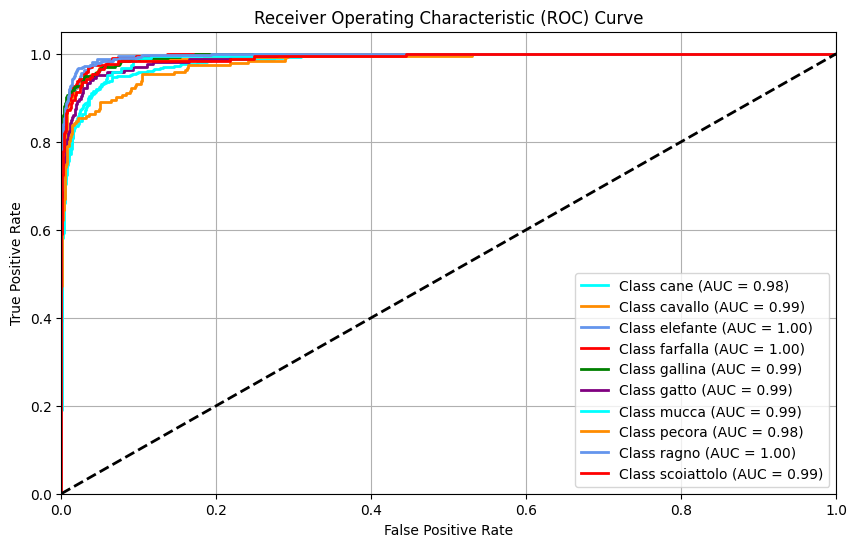

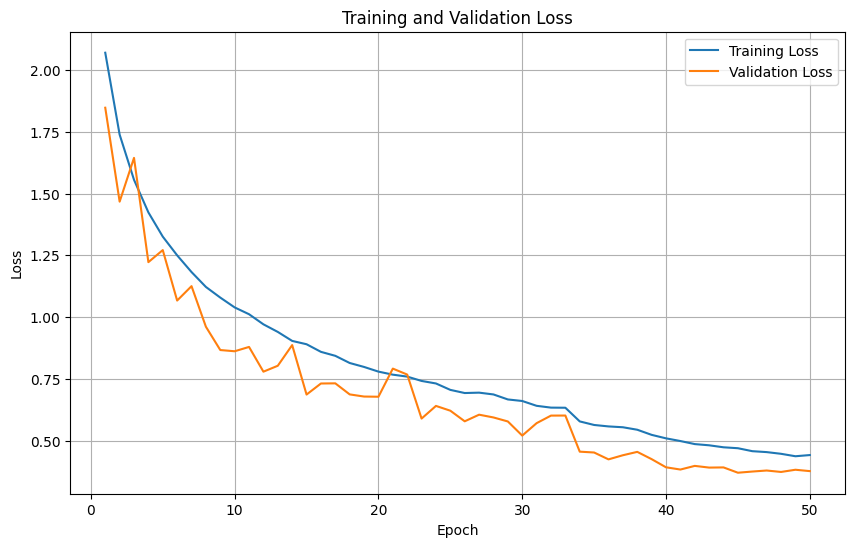

In [59]:
# Plot learning curves
class_names = train_data.classes
plot_learning_curves(OptimizedCNNPhase2_training_accuracies, OptimizedCNNPhase2_validation_accuracies)
plot_confusion_matrix(OptimizedCNNPhase2, val_loader, class_names)
plot_roc_curve(OptimizedCNNPhase2, val_loader, class_names)

plot_training_validation_losses(OptimizedCNNPhase2_train_losses, OptimizedCNNPhase2, 50)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.490453..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.47332823..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5332649..1.6282789].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49901533..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5178571..1.6004902].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.55038965..1.82].
Clipping 

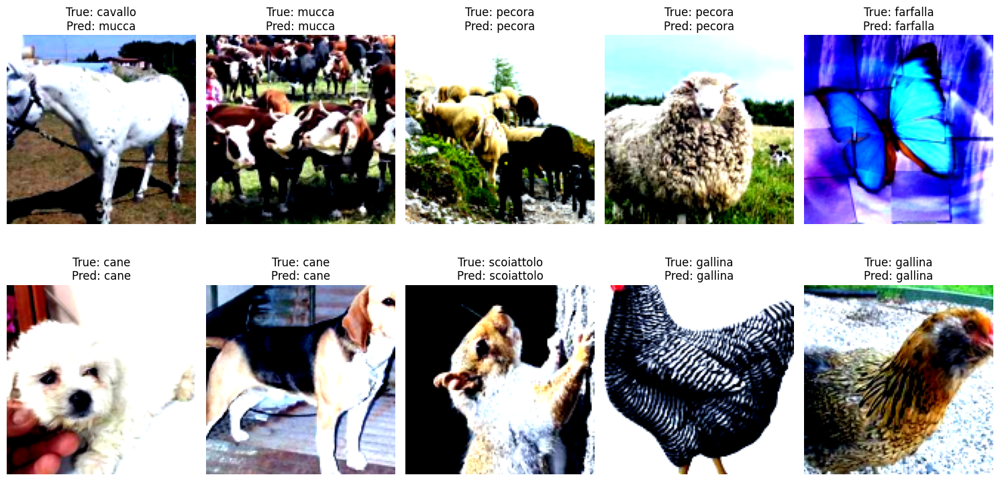

In [63]:
visualize_predictions_with_class_names(OptimizedCNNPhase2, test_loader, device, class_names, num_images=10)

In [46]:
evaluate_model(OptimizedCNNPhase2, test_loader, device)


Precision: 0.87
Recall: 0.87
F1-Score: 0.87


In [ ]:
torch.save(OptimizedCNNPhase2.state_dict(), "OptimizedCNNPhase2.pth")
del OptimizedCNNPhase2
del optimizer
torch.cuda.empty_cache()

### Check other hyper parameters

#### Small weight decay

In [63]:
OptimizedCNNPhase2 = OptimizedCNNPhase2()
OptimizedCNNPhase2 = OptimizedCNNPhase2.to(device)
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.parameters(), lr=learning_rate,weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase2_training_accuracies, OptimizedCNNPhase2_validation_accuracies, OptimizedCNNPhase2_train_losses, OptimizedCNNPhase2_val_losses=train_model_with_early_stopping(OptimizedCNNPhase2, train_aug_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)



Epoch 1/100, Training Accuracy: 0.2844, Validation Accuracy: 0.3703,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 65.0784, Validation Loss: 1.8476
Epoch 2/100, Training Accuracy: 0.3990, Validation Accuracy: 0.4008,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 55.5129, Validation Loss: 1.7248
Epoch 3/100, Training Accuracy: 0.4561, Validation Accuracy: 0.4482,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 50.7722, Validation Loss: 1.6286
Epoch 4/100, Training Accuracy: 0.5117, Validation Accuracy: 0.4776,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 45.9102, Validation Loss: 1.5609
Epoch 5/100, Training Accuracy: 0.5450, Validation Accuracy: 0.5438,Learning Rate: 0.200000
Epoch 5/100, Training Loss: 42.6683, Validation Loss: 1.3576
Epoch 6/100, Training Accuracy: 0.5672, Validation Accuracy: 0.6087,Learning Rate: 0.200000
Epoch 6/100, Training Loss: 40.2462, Validation Loss: 1.1409
Epoch 7/100, Training Accuracy: 0.6005, Validation Accuracy: 0.6251,Learning Rate:

#### Big weight Decay

In [29]:
OptimizedCNNPhase2 = OptimizedCNNPhase2()
OptimizedCNNPhase2 = OptimizedCNNPhase2.to(device)
patience=5
num_epochs = 100
learning_rate = 0.2
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.parameters(), lr=learning_rate,weight_decay=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase2_training_accuracies, OptimizedCNNPhase2_validation_accuracies, OptimizedCNNPhase2_train_losses, OptimizedCNNPhase2_val_losses=train_model_with_early_stopping(OptimizedCNNPhase2, train_aug_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)



Epoch 1/100, Training Accuracy: 0.3000, Validation Accuracy: 0.4184,Learning Rate: 0.200000
Epoch 1/100, Training Loss: 65.2151, Validation Loss: 1.7271
Epoch 2/100, Training Accuracy: 0.4262, Validation Accuracy: 0.4864,Learning Rate: 0.200000
Epoch 2/100, Training Loss: 53.2397, Validation Loss: 1.4667
Epoch 3/100, Training Accuracy: 0.5002, Validation Accuracy: 0.5529,Learning Rate: 0.200000
Epoch 3/100, Training Loss: 46.9932, Validation Loss: 1.3132
Epoch 4/100, Training Accuracy: 0.5420, Validation Accuracy: 0.4960,Learning Rate: 0.200000
Epoch 4/100, Training Loss: 43.1560, Validation Loss: 1.5094
No improvement for 1 epoch(s).
Epoch 5/100, Training Accuracy: 0.5787, Validation Accuracy: 0.6229,Learning Rate: 0.200000
Epoch 5/100, Training Loss: 39.7106, Validation Loss: 1.0887
Epoch 6/100, Training Accuracy: 0.6111, Validation Accuracy: 0.5747,Learning Rate: 0.200000
Epoch 6/100, Training Loss: 36.8206, Validation Loss: 1.2428
No improvement for 1 epoch(s).
Epoch 7/100, Trainin

#### Adam optimizer

In [47]:
torch.cuda.empty_cache()
patience=5
num_epochs = 50
learning_rate = 0.001
criterion = nn.CrossEntropyLoss()

# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
optimizer=optim.Adam(OptimizedCNNPhase2.parameters(), lr=learning_rate)   # Momentum terms for running averageseps=1e-8)  # Small value to prevent division by zeroscheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2,verbose=True)
OptimizedCNNPhase2_training_accuracies, OptimizedCNNPhase2_validation_accuracies , OptimizedCNNPhase2_train_losses, OptimizedCNNPhase2_val_losses =train_model(OptimizedCNNPhase2, train_aug_loader, val_loader , criterion, optimizer, num_epochs)

Epoch 1/50, Training Accuracy: 0.3606, Validation Accuracy: 0.3626, Learning Rate: 0.001000
Epoch 1/50, Training Loss: 1.8421, Validation Loss: 1.8611
Epoch 2/50, Training Accuracy: 0.4858, Validation Accuracy: 0.5101, Learning Rate: 0.001000
Epoch 2/50, Training Loss: 1.5024, Validation Loss: 1.3787
Epoch 3/50, Training Accuracy: 0.5438, Validation Accuracy: 0.6018, Learning Rate: 0.001000
Epoch 3/50, Training Loss: 1.3290, Validation Loss: 1.1288
Epoch 4/50, Training Accuracy: 0.5937, Validation Accuracy: 0.6519, Learning Rate: 0.001000
Epoch 4/50, Training Loss: 1.1981, Validation Loss: 1.0232
Epoch 5/50, Training Accuracy: 0.6141, Validation Accuracy: 0.6695, Learning Rate: 0.001000
Epoch 5/50, Training Loss: 1.1408, Validation Loss: 0.9711
Epoch 6/50, Training Accuracy: 0.6422, Validation Accuracy: 0.6817, Learning Rate: 0.001000
Epoch 6/50, Training Loss: 1.0570, Validation Loss: 0.9157
Epoch 7/50, Training Accuracy: 0.6604, Validation Accuracy: 0.6851, Learning Rate: 0.001000
Ep

# Phase 4

## Transfer Learning

### Dataset 1

#### Part 1

In [ ]:
batch_size = 8  
num_workers = 4  
train_loader = DataLoader(train_dataset1_p4, batch_size=batch_size,shuffle=False, num_workers=num_workers)
val_loader = DataLoader(val_dataset1_p4, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset1_p4, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print(f"Training samples: {len(train_dataset1_p4)}")
print(f"Validation samples: {len(val_dataset1_p4)}")
print(f"Test samples: {len(test_dataset1_p4)}")


##### Initialize Best model and train model

In [ ]:
OptimizedCNNPhase2 = OptimizedCNNPhase2()

state_dict = torch.load("./models/best_model.pth")
OptimizedCNNPhase2.load_state_dict(state_dict)

OptimizedCNNPhase2 = OptimizedCNNPhase2.to(device)


Freeze feature layer

In [ ]:
for param in OptimizedCNNPhase2.features.parameters():
    param.requires_grad = False

Print total parameters and trainable parameters

In [ ]:
trainableParam(OptimizedCNNPhase2)

Total Parameters: 198682
Trainable Parameters: 2570


summery of our model after freeze feature layer

In [ ]:

summary(OptimizedCNNPhase2, input_size=(3, 128, 128), device=str(device))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [ ]:

# Loss and optimizer
patience=10
num_epochs = 50

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.classifier.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_training_accuracies, Optimized2CNNPhase4_validation_accuracies , Optimized2CNNPhase4_train_losses, Optimized2CNNPhase4_val_losses = train_model_with_early_stopping(OptimizedCNNPhase2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


c:\Users\xmart\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/50, Training Accuracy: 0.1164, Validation Accuracy: 0.1385,Learning Rate: 0.010000
Epoch 1/50, Training Loss: 34.2928, Validation Loss: 3.5956
Validation loss improved. Saving the model...
Epoch 2/50, Training Accuracy: 0.1573, Validation Accuracy: 0.1538,Learning Rate: 0.010000
Epoch 2/50, Training Loss: 25.2187, Validation Loss: 2.6658
Validation loss improved. Saving the model...
Epoch 3/50, Training Accuracy: 0.2148, Validation Accuracy: 0.2308,Learning Rate: 0.010000
Epoch 3/50, Training Loss: 19.6288, Validation Loss: 2.2198
Validation loss improved. Saving the model...
Epoch 4/50, Training Accuracy: 0.2545, Validation Accuracy: 0.2615,Learning Rate: 0.010000
Epoch 4/50, Training Loss: 17.1196, Validation Loss: 2.0983
Validation loss improved. Saving the model...
Epoch 5/50, Training Accuracy: 0.3159, Validation Accuracy: 0.2923,Learning Rate: 0.010000
Epoch 5/50, Training Loss: 15.8437, Validation Loss: 1.9806
Validation loss improved. Saving the model...
Epoch 6/50, Tra

##### Result 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.70560455..1.890797].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.9001429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.686769..1.7506074].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.733858..1.8721051].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.7879913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.66605806..1.8347213].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.70380

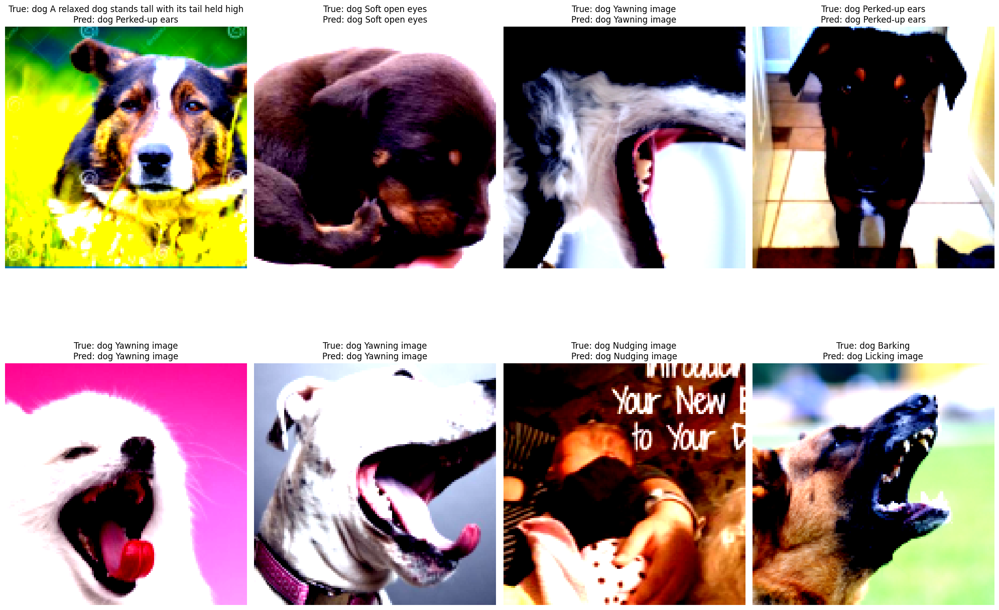

In [ ]:
# Define class names (you can modify this list based on your dataset)
class_names = test_loader.dataset.dataset.classes  # Assumes ImageFolder or similar
visualize_predictions_with_class_names(OptimizedCNNPhase2, test_loader, device, class_names, num_images=10)

In [ ]:
# Example usage
precision, recall, f1 = evaluate_model(OptimizedCNNPhase2, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.47
Recall: 0.44
F1-Score: 0.44


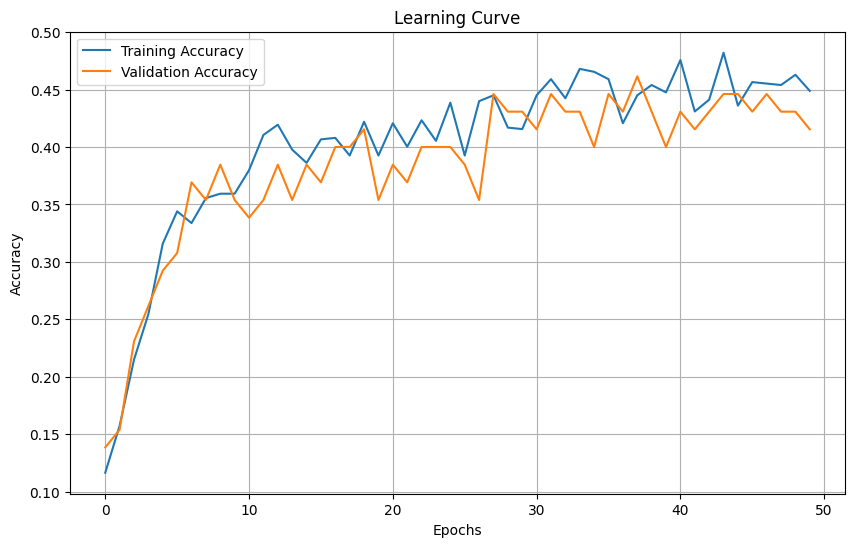

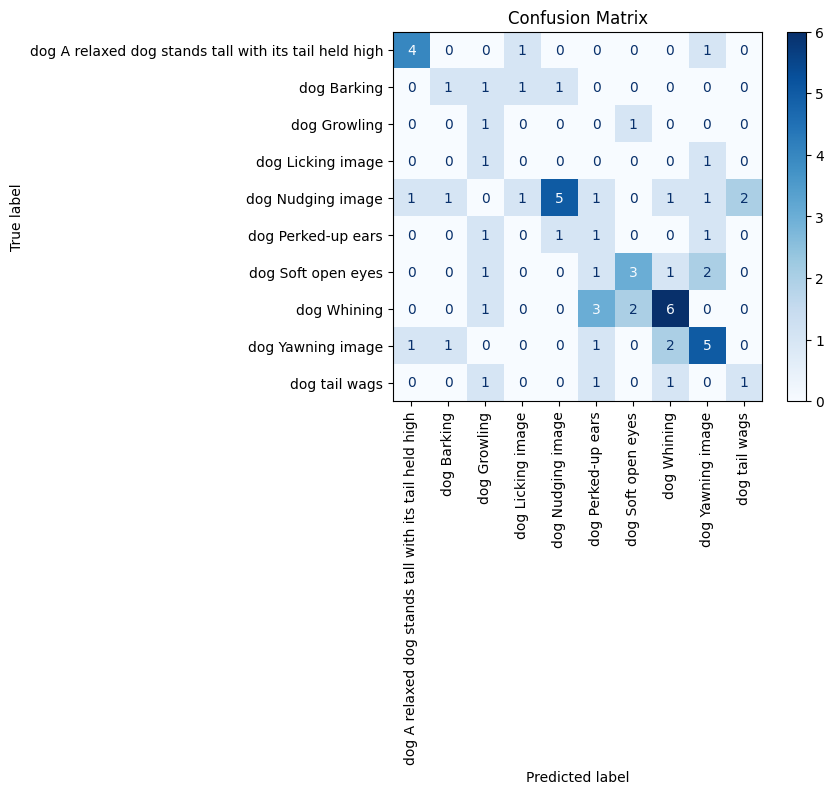

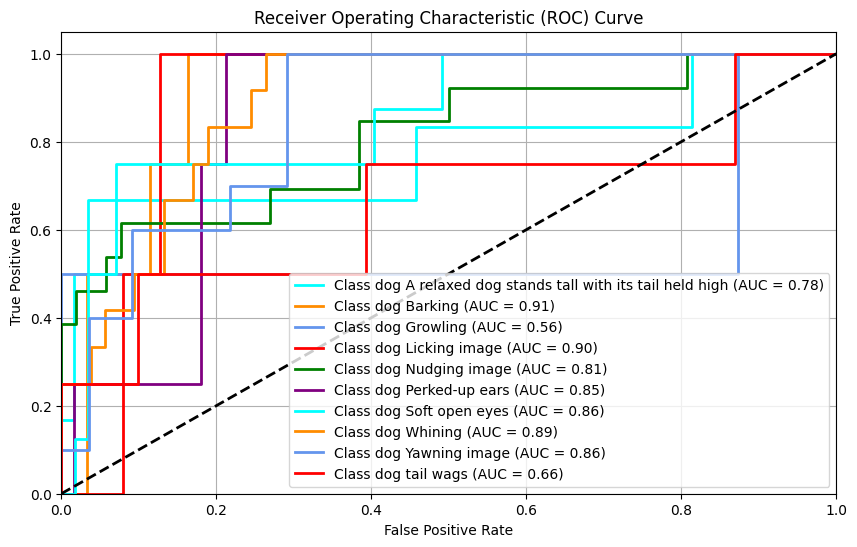

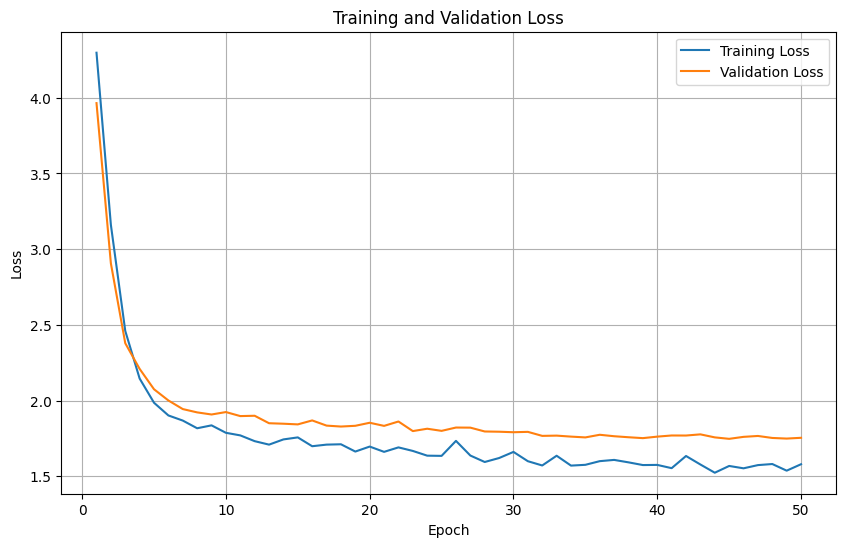

In [ ]:
class_names = dataset.classes

plot_learning_curves(Optimized2CNNPhase4_training_accuracies, Optimized2CNNPhase4_validation_accuracies)
plot_confusion_matrix(OptimizedCNNPhase2, val_loader, class_names)
plot_roc_curve(OptimizedCNNPhase2, val_loader, class_names)
plot_training_validation_losses( Optimized2CNNPhase4_train_losses, Optimized2CNNPhase4_val_losses, 50)


#### Part 2

##### Initialize Best model and train model

In [ ]:
# Instantiate the model
OptimizedCNNPhase2_p2 = OptimizedCNNPhase2()

state_dict = torch.load("./models/best_model.pth")
OptimizedCNNPhase2_p2.load_state_dict(state_dict)
OptimizedCNNPhase2_p2 = OptimizedCNNPhase2_p2.to(device)


Freeze a specific layer (1 block of our model)

In [ ]:
for param in OptimizedCNNPhase2_p2.features[18:30].parameters():
    param.requires_grad = False

Print total parameters and trainable parameters

In [ ]:
trainableParam(OptimizedCNNPhase2_p2)

summery of our model after freeze specific layer

In [ ]:
summary(OptimizedCNNPhase2_p2, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [ ]:
# Loss and optimizer
patience=10
num_epochs = 20
learning_rate = 0.1
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2_p2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_p2_training_accuracies, Optimized2CNNPhase4_p2_validation_accuracies , Optimized2CNNPhase4_p2_train_losses, Optimized2CNNPhase4_p2_val_losses = train_model_with_early_stopping(OptimizedCNNPhase2_p2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)

Epoch 1/20, Training Accuracy: 0.1306, Validation Accuracy: 0.1471,Learning Rate: 0.100000
Epoch 1/20, Training Loss: 20.7401, Validation Loss: 2.3546
Epoch 2/20, Training Accuracy: 0.1442, Validation Accuracy: 0.0882,Learning Rate: 0.100000
Epoch 2/20, Training Loss: 18.2962, Validation Loss: 2.4931
No improvement for 1 epoch(s).
Epoch 3/20, Training Accuracy: 0.1510, Validation Accuracy: 0.1471,Learning Rate: 0.100000
Epoch 3/20, Training Loss: 18.1858, Validation Loss: 2.2557
Epoch 4/20, Training Accuracy: 0.1497, Validation Accuracy: 0.1324,Learning Rate: 0.100000
Epoch 4/20, Training Loss: 18.0367, Validation Loss: 2.2854
No improvement for 1 epoch(s).
Epoch 5/20, Training Accuracy: 0.1442, Validation Accuracy: 0.1765,Learning Rate: 0.100000
Epoch 5/20, Training Loss: 17.9864, Validation Loss: 2.2478
Epoch 6/20, Training Accuracy: 0.1524, Validation Accuracy: 0.1471,Learning Rate: 0.100000
Epoch 6/20, Training Loss: 18.0364, Validation Loss: 2.3288
No improvement for 1 epoch(s).
E

##### Result

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.8721051].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.733858..1.8160293].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.8160293].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7244402..1.441652].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.67735124..1.6740503].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.9001429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7338

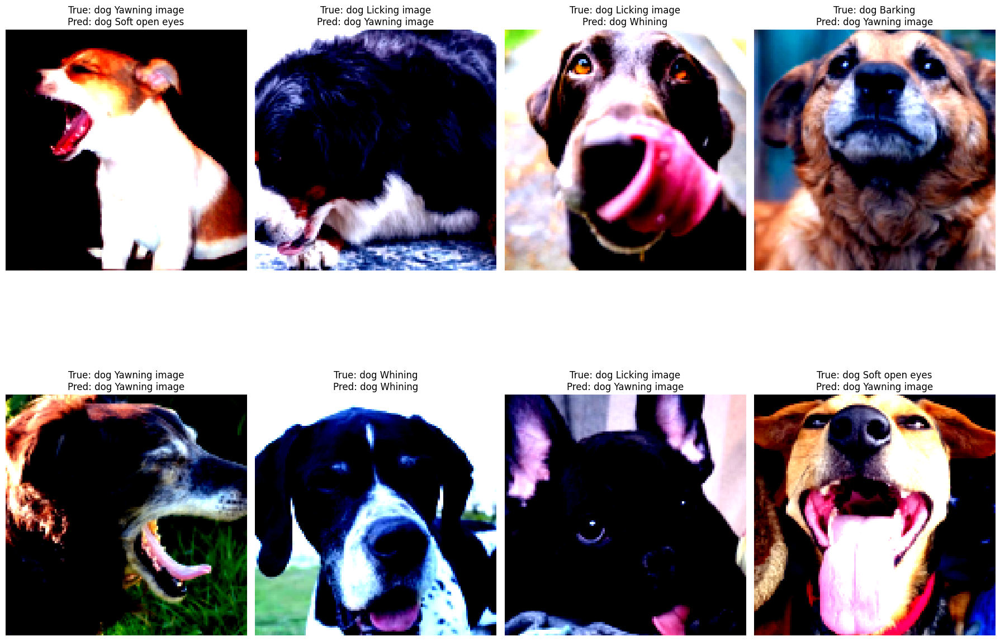

In [ ]:
class_names = test_loader.dataset.dataset.classes  
visualize_predictions_with_class_names(OptimizedCNNPhase2_p2, test_loader, device, class_names, num_images=10)

In [ ]:
precision, recall, f1 = evaluate_model(OptimizedCNNPhase2_p2, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.21 <br />
Recall: 0.24<br />
F1-Score: 0.21<br />

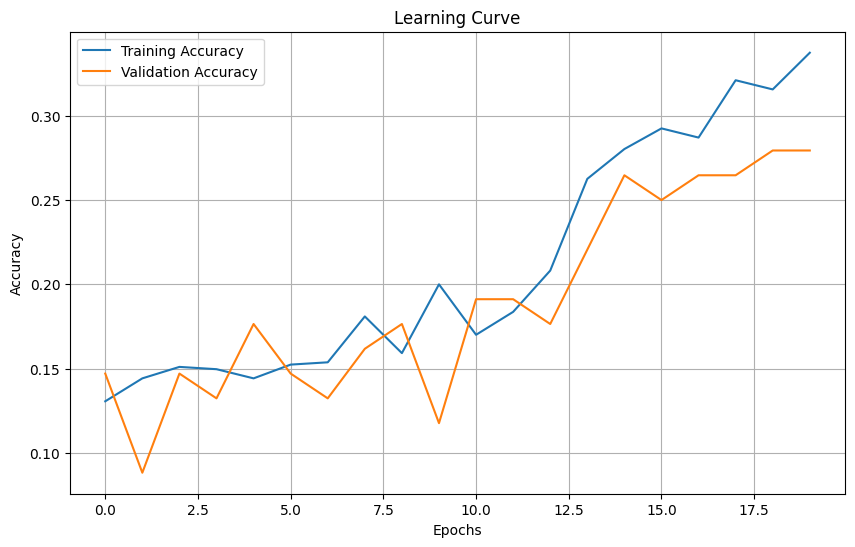

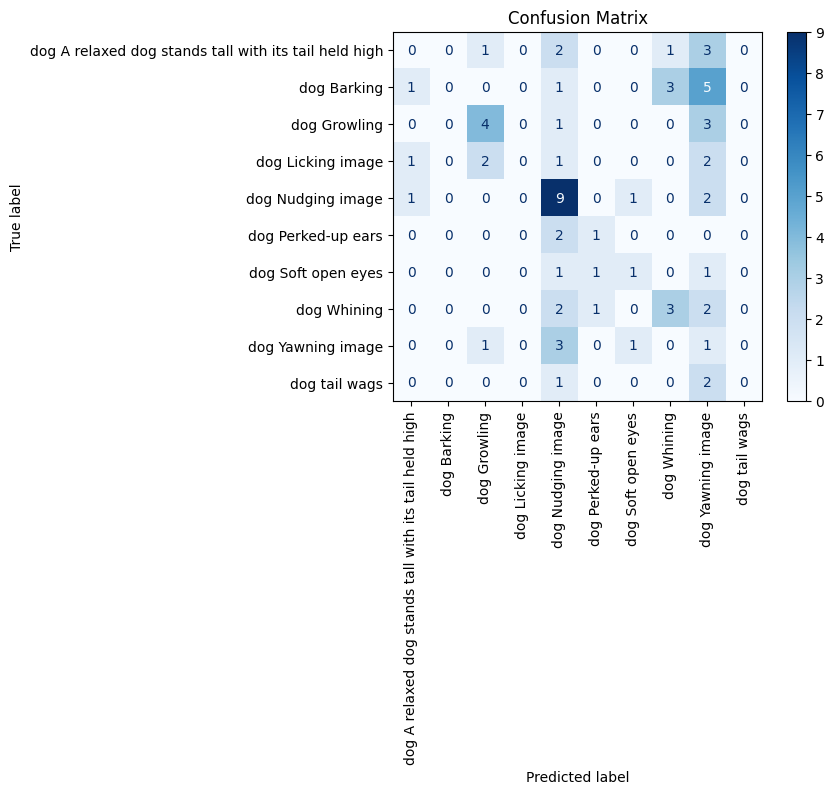

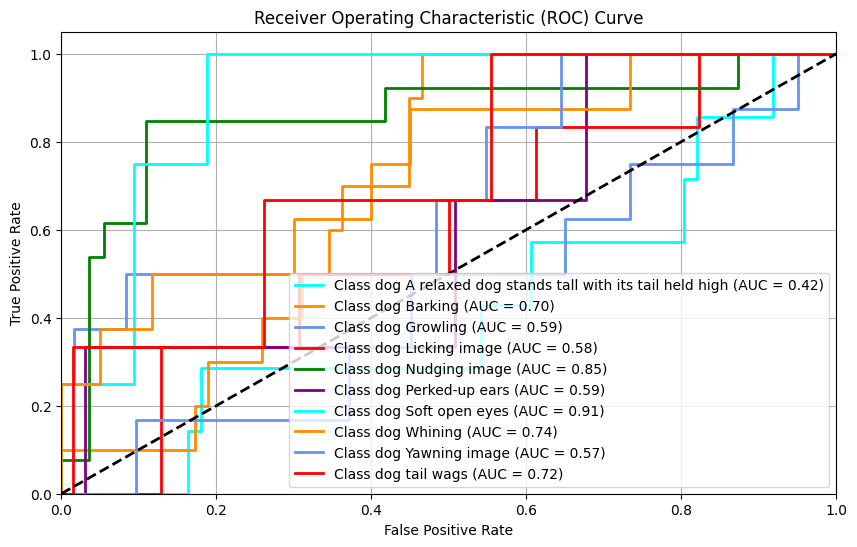

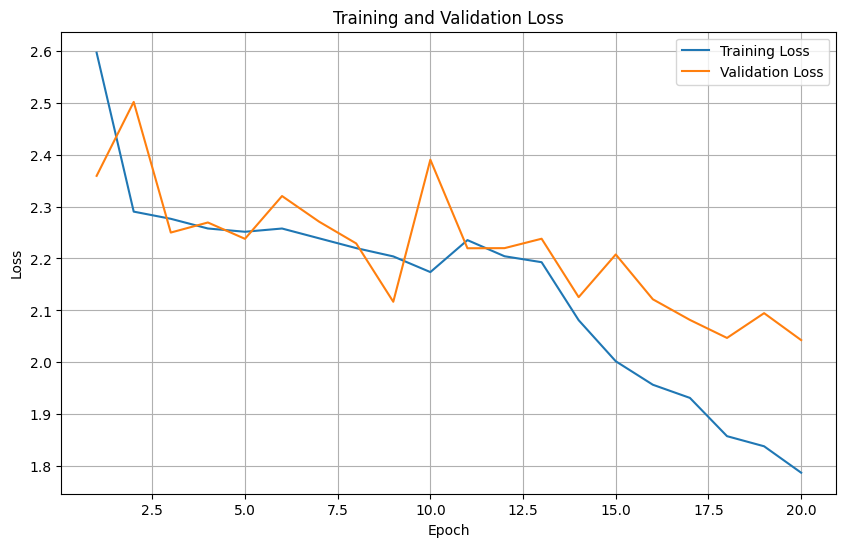

In [ ]:
class_names = dataset.classes

plot_learning_curves(Optimized2CNNPhase4_p2_training_accuracies, Optimized2CNNPhase4_p2_validation_accuracies)
plot_confusion_matrix(OptimizedCNNPhase2_p2, val_loader, class_names)
plot_roc_curve(OptimizedCNNPhase2_p2, val_loader, class_names)
plot_training_validation_losses( Optimized2CNNPhase4_p2_train_losses, Optimized2CNNPhase4_p2_val_losses, num_epochs)


### Dataset 2

In [9]:

batch_size = 8  
num_workers = 4  
train_loader = DataLoader(train_dataset2_p4, batch_size=batch_size,shuffle=False, num_workers=num_workers)
val_loader = DataLoader(val_dataset2_p4, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset2_p4, batch_size=batch_size, shuffle=False, num_workers=num_workers)


print(f"Training samples: {len(train_dataset2_p4)}")
print(f"Validation samples: {len(val_dataset2_p4)}")
print(f"Test samples: {len(test_dataset2_p4)}")


Training samples: 1272
Validation samples: 60
Test samples: 122


#### Part 1

##### Initialize Best model and train model

In [ ]:
OptimizedCNNPhase2 = OptimizedCNNPhase2()
state_dict = torch.load("./models/best_model.pth")
OptimizedCNNPhase2.load_state_dict(state_dict)
OptimizedCNNPhase2 = OptimizedCNNPhase2.to(device)


Modify the classifier layer


In [ ]:
# Modify the classifier layer
OptimizedCNNPhase2.classifier = nn.Sequential(
    nn.AdaptiveAvgPool2d(1), 
    nn.Flatten(), 
    nn.Dropout(p=0.5),
    nn.Linear(256, 3)   
)


Print total parameters and trainable parameters

In [ ]:
trainableParam(OptimizedCNNPhase2)

Total Parameters: 196883
Trainable Parameters: 196883


Summery of my now model with 3 output

In [ ]:
summary(OptimizedCNNPhase2, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,216
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           6,416
              ReLU-4         [-1, 16, 128, 128]               0
         MaxPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]             320
       BatchNorm2d-7           [-1, 32, 64, 64]              64
              ReLU-8           [-1, 32, 64, 64]               0
            Conv2d-9           [-1, 32, 64, 64]           1,056
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 32, 64, 64]             320
      BatchNorm2d-13           [-1, 32, 64, 64]              64
             ReLU-14           [-1, 32,

In [ ]:
patience=5
num_epochs = 50

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_3_training_accuracies, Optimized2CNNPhase4_3_validation_accuracies , Optimized2CNNPhase4_3_train_losses, Optimized2CNNPhase4_3_val_losses = train_model_with_early_stopping(OptimizedCNNPhase2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/50, Training Accuracy: 0.7759, Validation Accuracy: 0.9000,Learning Rate: 0.010000
Epoch 1/50, Training Loss: 4.4338, Validation Loss: 0.2686
Validation loss improved. Saving the model...
Epoch 2/50, Training Accuracy: 0.9135, Validation Accuracy: 0.9000,Learning Rate: 0.010000
Epoch 2/50, Training Loss: 1.9854, Validation Loss: 0.2350
Validation loss improved. Saving the model...
Epoch 3/50, Training Accuracy: 0.9560, Validation Accuracy: 0.8667,Learning Rate: 0.010000
Epoch 3/50, Training Loss: 1.0929, Validation Loss: 0.3004
No improvement for 1 epoch(s).
Epoch 4/50, Training Accuracy: 0.9764, Validation Accuracy: 0.8833,Learning Rate: 0.010000
Epoch 4/50, Training Loss: 0.7325, Validation Loss: 0.2946
No improvement for 2 epoch(s).
Epoch 5/50, Training Accuracy: 0.9796, Validation Accuracy: 0.8500,Learning Rate: 0.010000
Epoch 5/50, Training Loss: 0.5934, Validation Loss: 0.2355
No improvement for 3 epoch(s).
Epoch 6/50, Training Accuracy: 0.9827, Validation Accuracy: 0.900

##### Result

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.71502244..1.6268708].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3853997..1.9001429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.71502244..1.862759].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.733858..1.890797].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74327576..1.9001429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7244402..1.7225697].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.724440

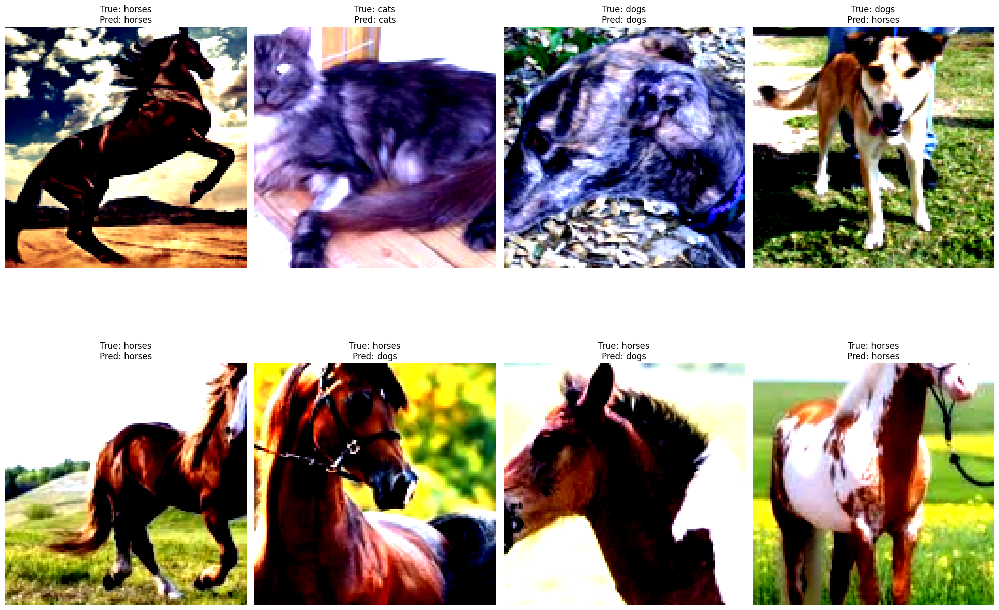

In [ ]:
class_names = test_loader.dataset.dataset.classes  # Assumes ImageFolder or similar
visualize_predictions_with_class_names(OptimizedCNNPhase2, test_loader, device, class_names, num_images=10)

In [ ]:
# Example usage
precision, recall, f1 = evaluate_model(OptimizedCNNPhase2, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.92
Recall: 0.92
F1-Score: 0.92


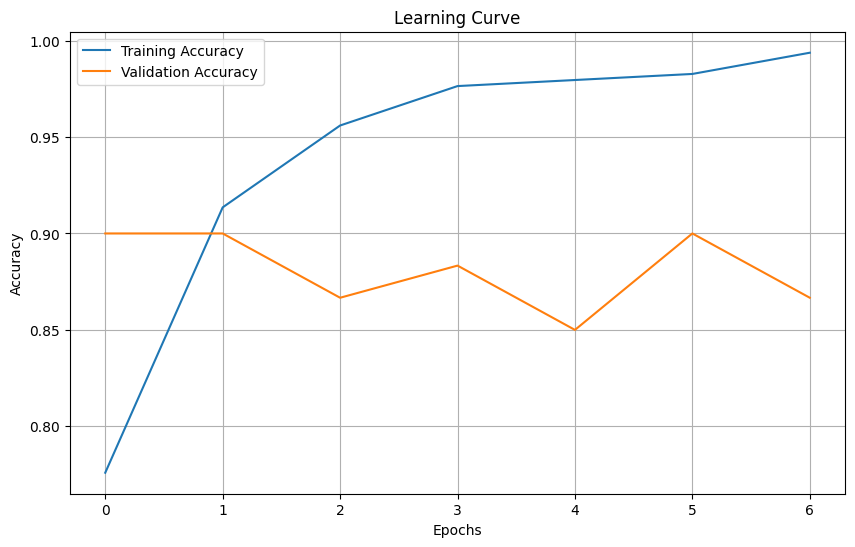

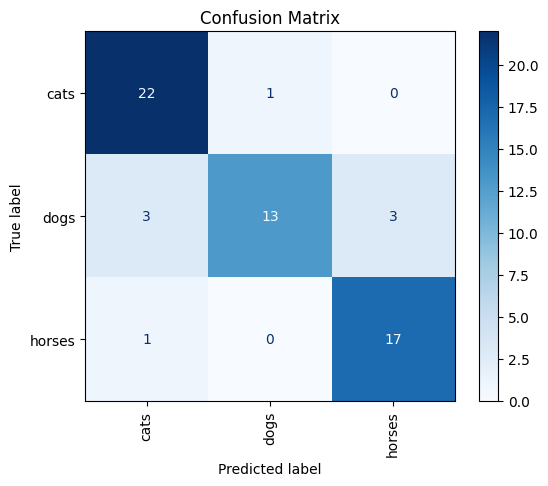

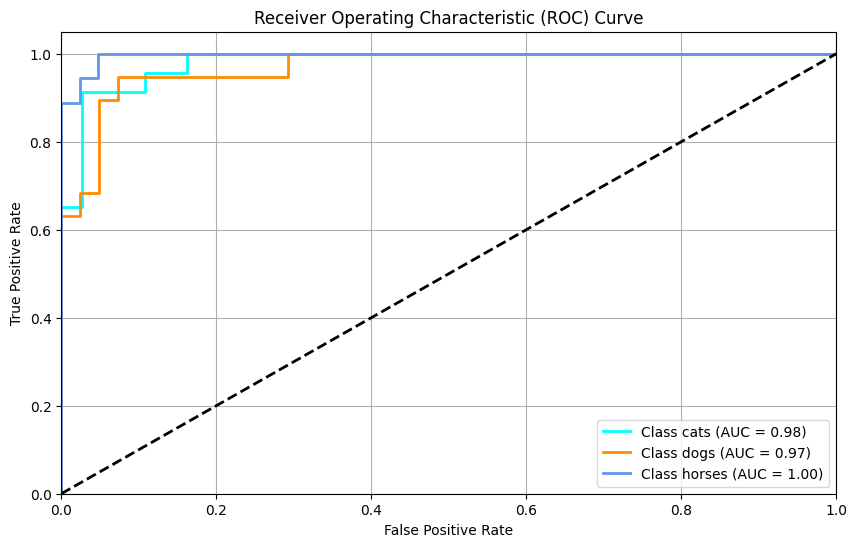

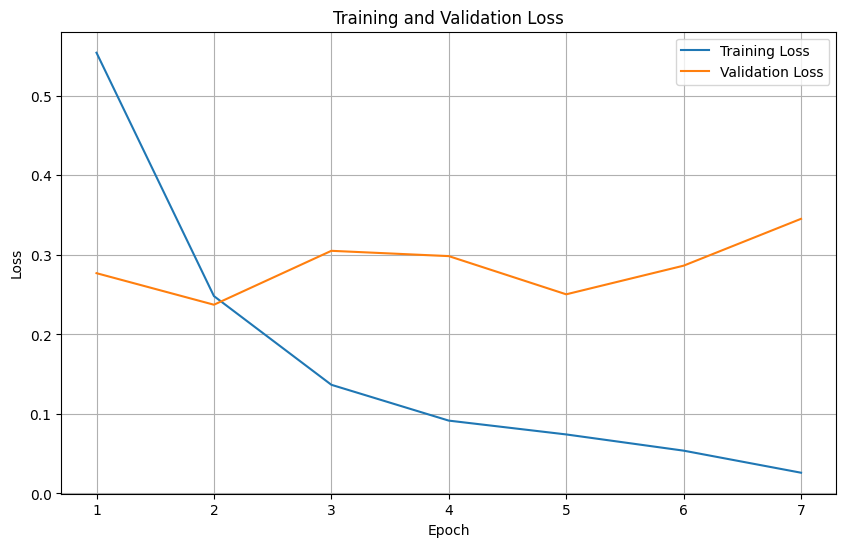

In [ ]:
class_names = dataset.classes

plot_learning_curves(Optimized2CNNPhase4_3_training_accuracies, Optimized2CNNPhase4_3_validation_accuracies)
plot_confusion_matrix(OptimizedCNNPhase2, val_loader, class_names)
plot_roc_curve(OptimizedCNNPhase2, val_loader, class_names)
plot_training_validation_losses( Optimized2CNNPhase4_3_train_losses, Optimized2CNNPhase4_3_val_losses, 7)


#### Part 2 and 3

##### ResNet50

###### Initialize and Train Model

In [ ]:
resNet50_model = models.resnet50(pretrained=True)

num_classes = 3
resNet50_model.fc = nn.Linear(in_features=2048, out_features=num_classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPhase4 = resNet50_model.to(device)

Freeze feature extractor layers and Enable training only for the classifier layer


In [ ]:
for param in resNet50_model.parameters():
    param.requires_grad = False

for param in resNet50_model.fc.parameters():
    param.requires_grad = True

In [ ]:
trainableParam(resNet50_model)

Total Parameters: 23514179
Trainable Parameters: 6147


Summery of reNet50 model without features layer

In [ ]:
summary(resNet50_model, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
patience=10
num_epochs = 20

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resNet50_model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_4_training_accuracies, Optimized2CNNPhase4_4_validation_accuracies , Optimized2CNNPhase4_4_train_losses, Optimized2CNNPhase4_4_val_losses = train_model_with_early_stopping(resNet50_model, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/20, Training Accuracy: 0.7830, Validation Accuracy: 0.9333,Learning Rate: 0.010000
Epoch 1/20, Training Loss: 9.1495, Validation Loss: 0.2632
Validation loss improved. Saving the model...
Epoch 2/20, Training Accuracy: 0.8553, Validation Accuracy: 0.9500,Learning Rate: 0.010000
Epoch 2/20, Training Loss: 6.7326, Validation Loss: 0.1538
Validation loss improved. Saving the model...
Epoch 3/20, Training Accuracy: 0.8758, Validation Accuracy: 0.9167,Learning Rate: 0.010000
Epoch 3/20, Training Loss: 6.2238, Validation Loss: 0.7382
No improvement for 1 epoch(s).
Epoch 4/20, Training Accuracy: 0.9064, Validation Accuracy: 0.8667,Learning Rate: 0.010000
Epoch 4/20, Training Loss: 4.3200, Validation Loss: 1.7691
No improvement for 2 epoch(s).
Epoch 5/20, Training Accuracy: 0.9324, Validation Accuracy: 0.9167,Learning Rate: 0.010000
Epoch 5/20, Training Loss: 3.0835, Validation Loss: 1.2776
No improvement for 3 epoch(s).
Epoch 6/20, Training Accuracy: 0.9119, Validation Accuracy: 0.883

###### Reslut

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.490453..1.4275194].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.37057972..1.6267507].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.38770443..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.55038965..1.2648343].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5178571..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.8025708].


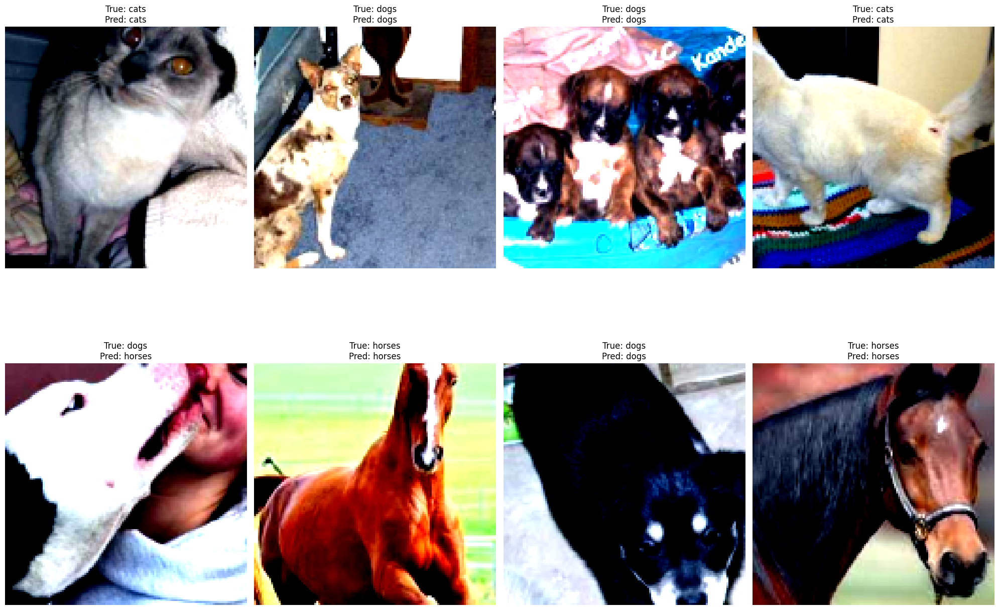

In [ ]:
class_names = test_loader.dataset.dataset.classes 
visualize_predictions_with_class_names(resNet50_model, test_loader, device, class_names, num_images=10)

In [ ]:
precision, recall, f1 = evaluate_model(resNet50_model, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.94
Recall: 0.94
F1-Score: 0.94


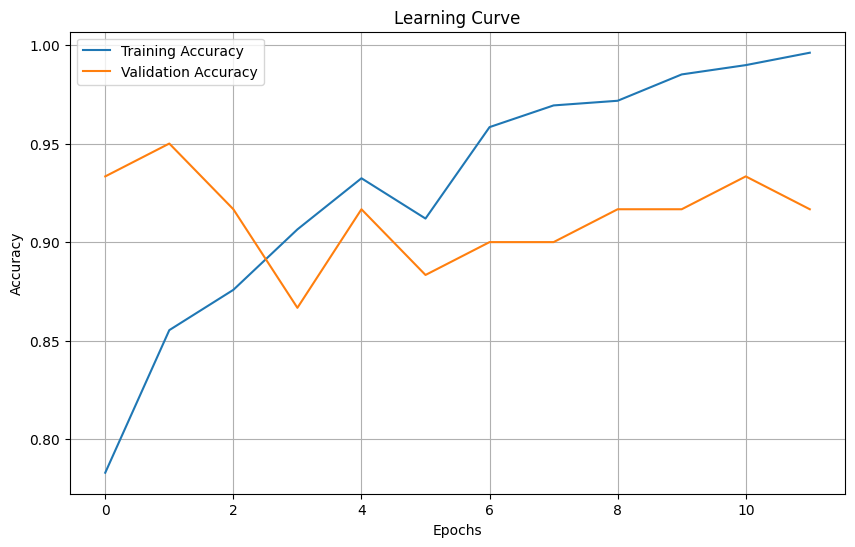

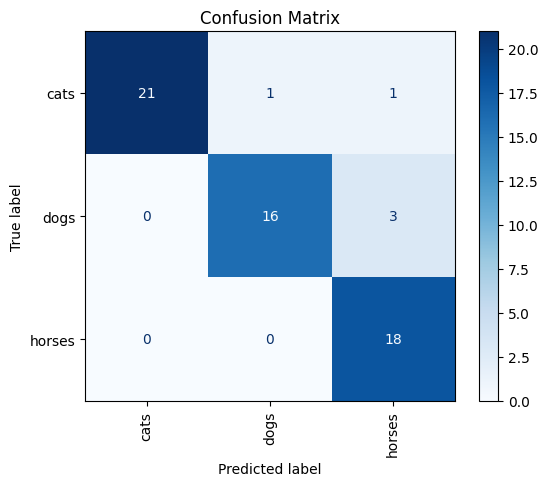

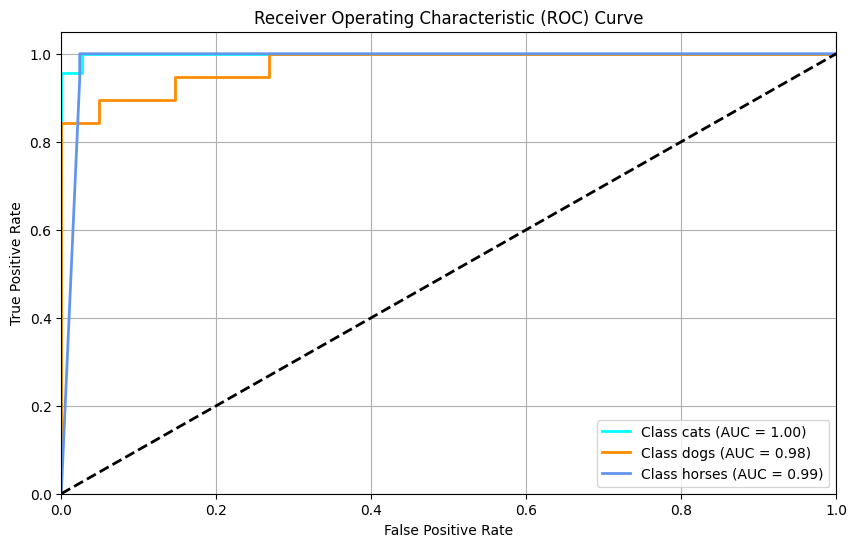

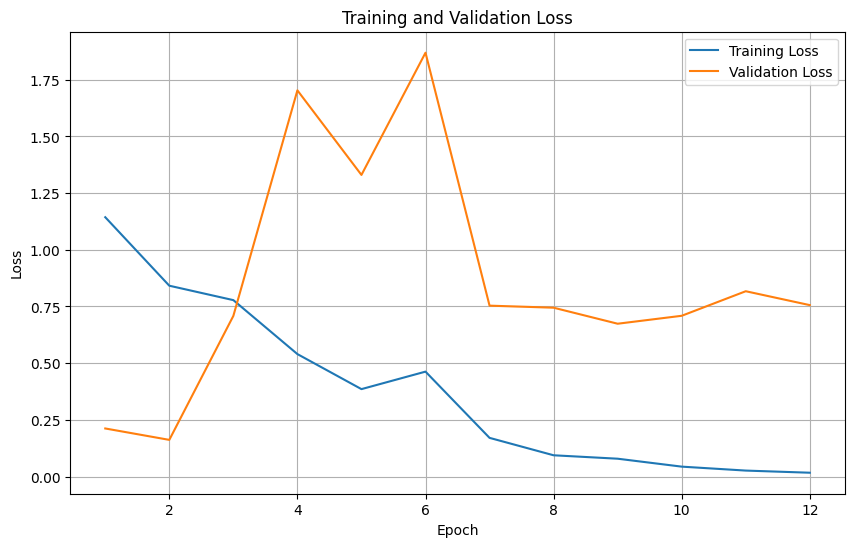

In [ ]:
class_names = dataset.classes

plot_learning_curves(Optimized2CNNPhase4_4_training_accuracies, Optimized2CNNPhase4_4_validation_accuracies)
plot_confusion_matrix(resNet50_model, val_loader, class_names)
plot_roc_curve(resNet50_model, val_loader, class_names)
plot_training_validation_losses( Optimized2CNNPhase4_4_train_losses, Optimized2CNNPhase4_4_val_losses, 12)


##### MobileNetV2

###### Initialize and Train Model

In [ ]:
mobilenet_v2 = models.mobilenet_v2(pretrained=True)
mobilenet_v2.classifier[1] = nn.Linear(in_features=1280, out_features=3)
mobilenet_v2 = mobilenet_v2.to(device)

Freeze feature extractor layers and Enable training only for the classifier layer

In [ ]:
for param in mobilenet_v2.features.parameters():
    param.requires_grad = False

for param in mobilenet_v2.classifier.parameters():
    param.requires_grad = True

In [ ]:
trainableParam(mobilenet_v2)

Total Parameters: 2227715
Trainable Parameters: 3843


Summery of MobileNetV2 model without features layer

In [ ]:
summary(mobilenet_v2, input_size=(3, 128, 128), device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 64, 64]             864
       BatchNorm2d-2           [-1, 32, 64, 64]              64
             ReLU6-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]             288
       BatchNorm2d-5           [-1, 32, 64, 64]              64
             ReLU6-6           [-1, 32, 64, 64]               0
            Conv2d-7           [-1, 16, 64, 64]             512
       BatchNorm2d-8           [-1, 16, 64, 64]              32
  InvertedResidual-9           [-1, 16, 64, 64]               0
           Conv2d-10           [-1, 96, 64, 64]           1,536
      BatchNorm2d-11           [-1, 96, 64, 64]             192
            ReLU6-12           [-1, 96, 64, 64]               0
           Conv2d-13           [-1, 96, 32, 32]             864
      BatchNorm2d-14           [-1, 96,

In [ ]:

# Loss and optimizer
patience=15
num_epochs = 40

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(mobilenet_v2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
mobilenet_v2_training_accuracies, mobilenet_v2_validation_accuracies , mobilenet_v2_train_losses, mobilenet_v2_val_losses = train_model_with_early_stopping(mobilenet_v2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


c:\Users\xmart\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/40, Training Accuracy: 0.7390, Validation Accuracy: 0.8833,Learning Rate: 0.010000
Epoch 1/40, Training Loss: 12.2125, Validation Loss: 0.5095
Validation loss improved. Saving the model...
Epoch 2/40, Training Accuracy: 0.8459, Validation Accuracy: 0.9167,Learning Rate: 0.010000
Epoch 2/40, Training Loss: 8.6799, Validation Loss: 0.5978
No improvement for 1 epoch(s).
Epoch 3/40, Training Accuracy: 0.8428, Validation Accuracy: 0.9500,Learning Rate: 0.010000
Epoch 3/40, Training Loss: 9.5487, Validation Loss: 0.4969
Validation loss improved. Saving the model...
Epoch 4/40, Training Accuracy: 0.8726, Validation Accuracy: 0.9500,Learning Rate: 0.010000
Epoch 4/40, Training Loss: 6.7694, Validation Loss: 0.7100
No improvement for 1 epoch(s).
Epoch 5/40, Training Accuracy: 0.9096, Validation Accuracy: 0.9167,Learning Rate: 0.010000
Epoch 5/40, Training Loss: 4.3404, Validation Loss: 0.5101
No improvement for 2 epoch(s).
Epoch 6/40, Training Accuracy: 0.9049, Validation Accuracy: 0.96

###### Result

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.732854].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2902661..1.6244541].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.50910366..1.671852].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.5149891].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.38770443..1.2884097].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.61

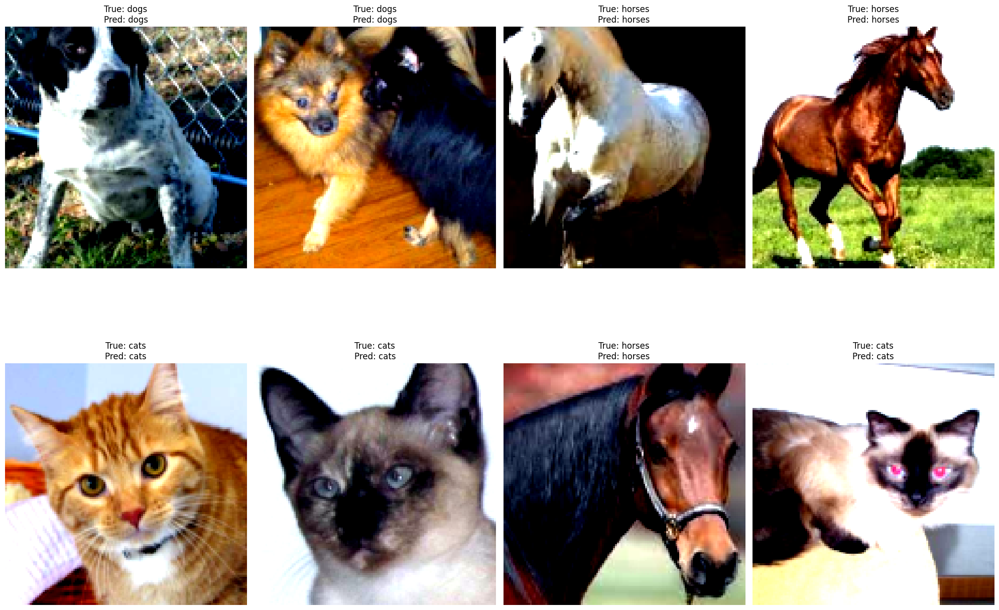

In [ ]:
# Define class names (you can modify this list based on your dataset)
class_names = test_loader.dataset.dataset.classes  # Assumes ImageFolder or similar
visualize_predictions_with_class_names(mobilenet_v2, test_loader, device, class_names, num_images=10)

In [ ]:
# Example usage
precision, recall, f1 = evaluate_model(mobilenet_v2, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.94
Recall: 0.94
F1-Score: 0.94


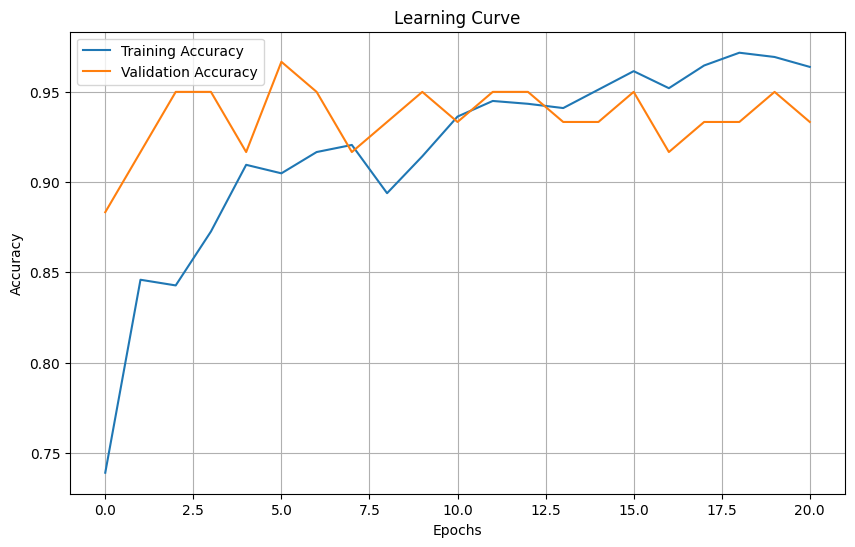

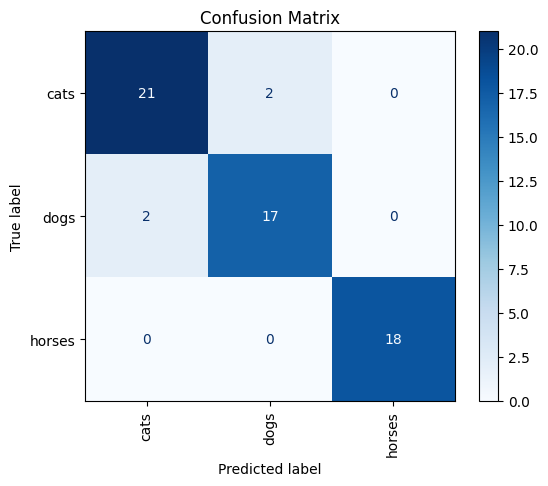

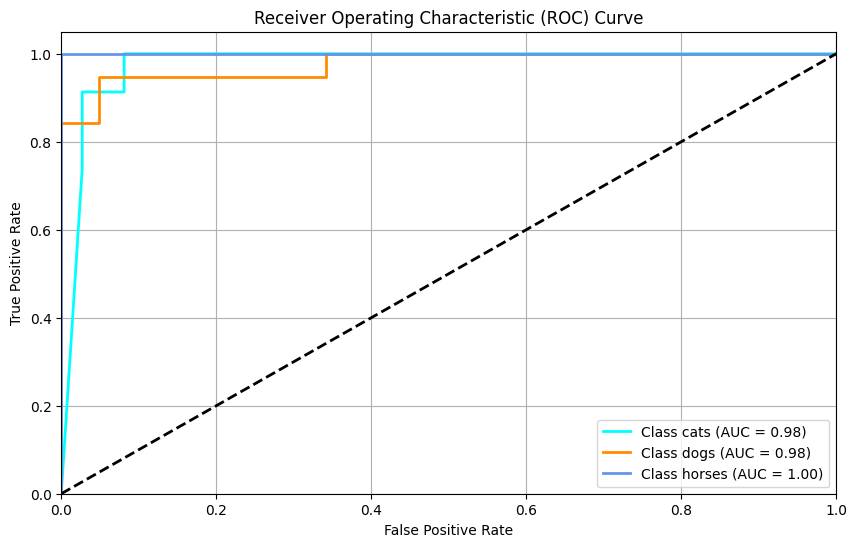

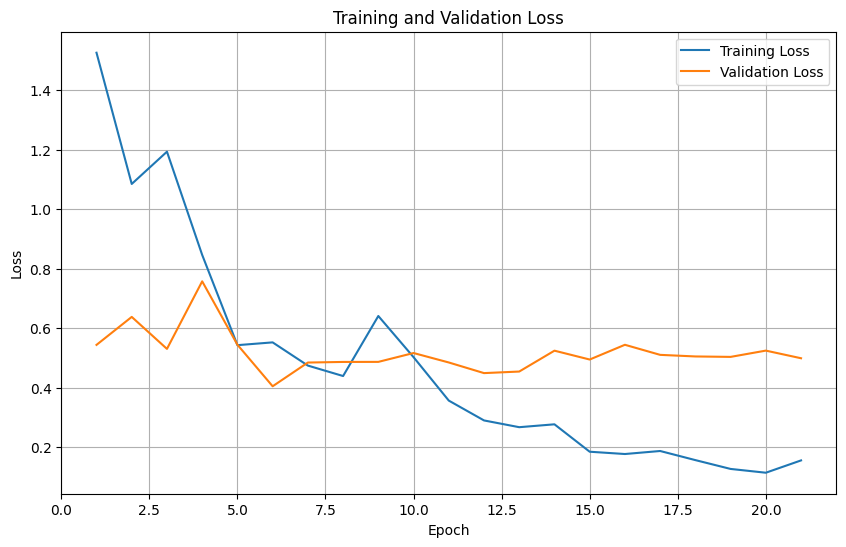

In [ ]:
class_names = dataset.classes

plot_learning_curves(mobilenet_v2_training_accuracies, mobilenet_v2_validation_accuracies)
plot_confusion_matrix(mobilenet_v2, val_loader, class_names)
plot_roc_curve(mobilenet_v2, val_loader, class_names)
plot_training_validation_losses( mobilenet_v2_train_losses, mobilenet_v2_val_losses, 21)


##### EfficientNetB0

###### Initialize and Train Model

In [12]:
efficientnet_b0 = models.efficientnet_b0(pretrained=True)
efficientnet_b0.classifier[1] = nn.Linear(in_features=1280, out_features=3)
efficientnet_b0 = efficientnet_b0.to(device)

In [13]:
# Freeze feature extractor layers
for param in efficientnet_b0.features.parameters():
    param.requires_grad = False

# Enable training only for the classifier layer
for param in efficientnet_b0.classifier.parameters():
    param.requires_grad = True

In [14]:
trainableParam(efficientnet_b0)

Total Parameters: 4011391
Trainable Parameters: 3843


Summery of EfficientnetB0 model without features layer

In [15]:
summary(efficientnet_b0, input_size=(3, 128, 128), device=str(device))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 64, 64]             864
       BatchNorm2d-2           [-1, 32, 64, 64]              64
              SiLU-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]             288
       BatchNorm2d-5           [-1, 32, 64, 64]              64
              SiLU-6           [-1, 32, 64, 64]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12           [-1, 32, 64, 64]               0
           Conv2d-13           [-1, 16, 64, 64]             512
      BatchNorm2d-14           [-1, 16,

In [ ]:

# Loss and optimizer
patience=15
num_epochs = 20

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(efficientnet_b0.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
efficientnet_b0_training_accuracies, efficientnet_b0_validation_accuracies , efficientnet_b0_train_losses, efficientnet_b0_val_losses = train_model_with_early_stopping(efficientnet_b0, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/20, Training Accuracy: 0.6321, Validation Accuracy: 0.8000,Learning Rate: 0.010000
Epoch 1/20, Training Loss: 6.4735, Validation Loss: 0.4001
Validation loss improved. Saving the model...
Epoch 2/20, Training Accuracy: 0.7665, Validation Accuracy: 0.8167,Learning Rate: 0.010000
Epoch 2/20, Training Loss: 4.8726, Validation Loss: 0.4075
No improvement for 1 epoch(s).
Epoch 3/20, Training Accuracy: 0.8160, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 3/20, Training Loss: 3.8089, Validation Loss: 0.5114
No improvement for 2 epoch(s).
Epoch 4/20, Training Accuracy: 0.7948, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 4/20, Training Loss: 4.0398, Validation Loss: 0.4926
No improvement for 3 epoch(s).
Epoch 5/20, Training Accuracy: 0.8208, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 5/20, Training Loss: 3.5162, Validation Loss: 0.5099
No improvement for 4 epoch(s).
Epoch 6/20, Training Accuracy: 0.8160, Validation Accuracy: 0.8500,Learning Rate

###### Result

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.732854].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2902661..1.6244541].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.558952..1.82].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.50910366..1.671852].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.5149891].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.38770443..1.2884097].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5161401..1.61

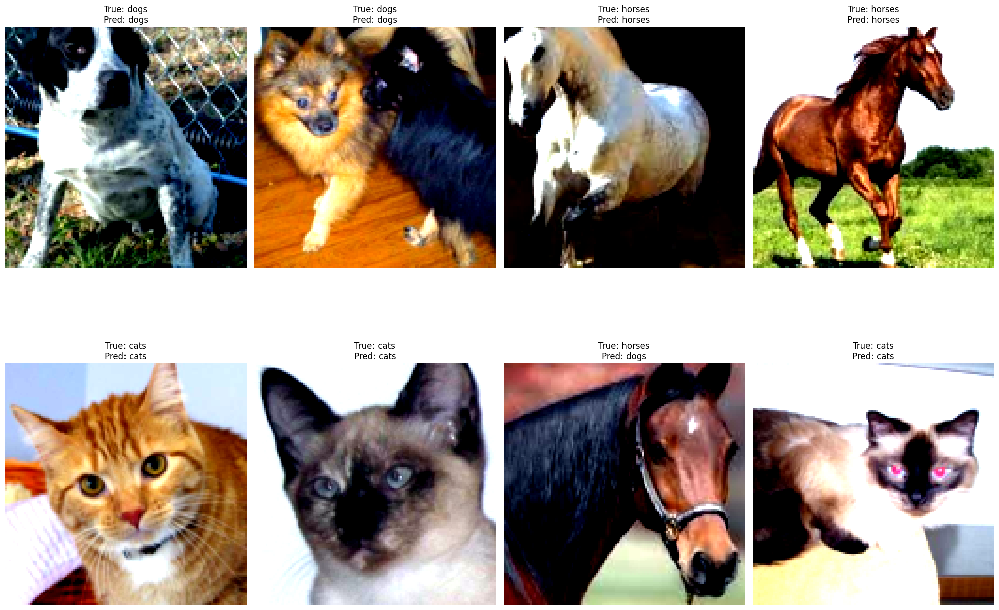

In [ ]:
class_names = test_loader.dataset.dataset.classes 
visualize_predictions_with_class_names(efficientnet_b0, test_loader, device, class_names, num_images=10)

In [ ]:
# Example usage
precision, recall, f1 = evaluate_model(efficientnet_b0, test_loader, device)
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')

Precision: 0.83
Recall: 0.83
F1-Score: 0.83


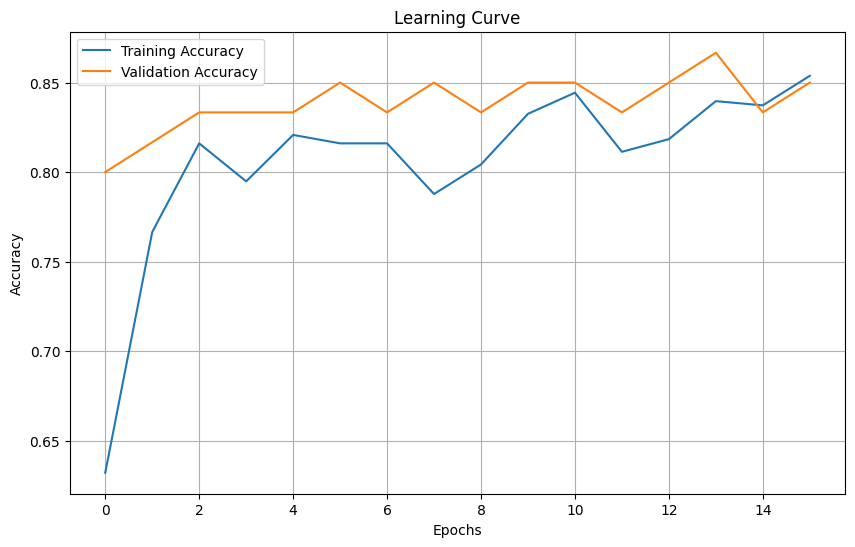

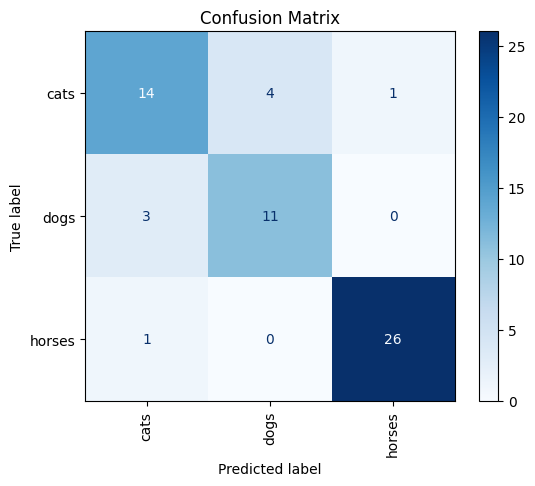

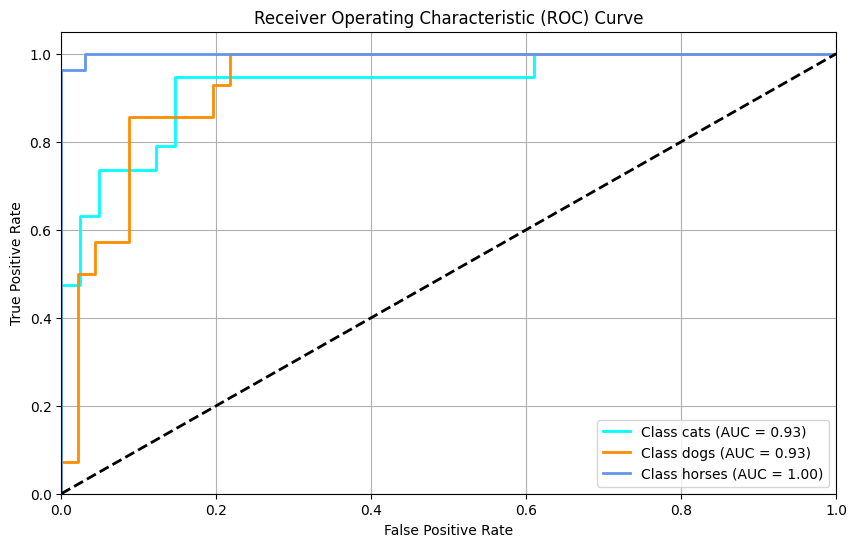

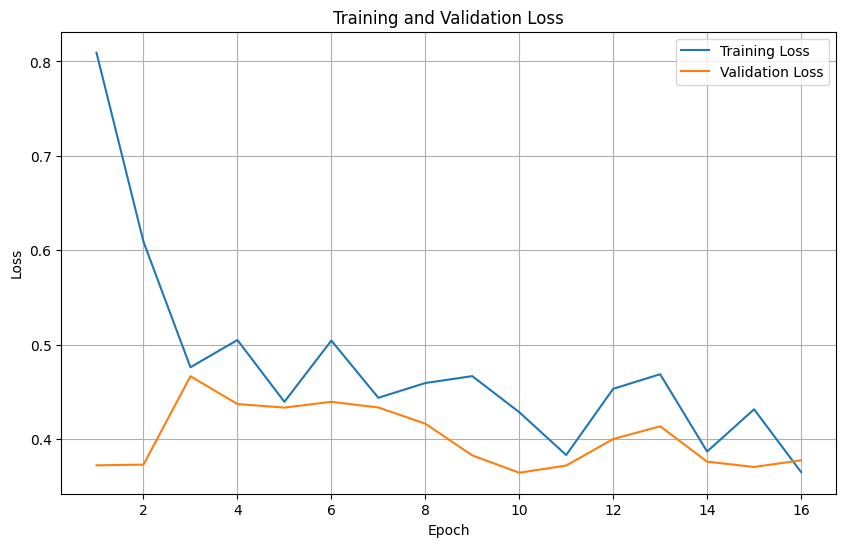

In [ ]:
class_names = dataset.classes
plot_learning_curves(efficientnet_b0_training_accuracies, efficientnet_b0_validation_accuracies)
plot_confusion_matrix(efficientnet_b0, val_loader, class_names)
plot_roc_curve(efficientnet_b0, val_loader, class_names)
plot_training_validation_losses( efficientnet_b0_train_losses, efficientnet_b0_val_losses, 16)


#### Check Models without Offline data Agumentation 

##### Optimized CNN Phase2

In [ ]:

# Loss and optimizer
patience=5
num_epochs = 50

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(OptimizedCNNPhase2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_3_training_accuracies, Optimized2CNNPhase4_3_validation_accuracies , Optimized2CNNPhase4_3_train_losses, Optimized2CNNPhase4_3_val_losses = train_model_with_early_stopping(OptimizedCNNPhase2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/50, Training Accuracy: 0.5236, Validation Accuracy: 0.7500,Learning Rate: 0.010000
Epoch 1/50, Training Loss: 15.5646, Validation Loss: 0.7303
Validation loss improved. Saving the model...
Epoch 2/50, Training Accuracy: 0.7288, Validation Accuracy: 0.7667,Learning Rate: 0.010000
Epoch 2/50, Training Loss: 5.5005, Validation Loss: 0.5085
Validation loss improved. Saving the model...
Epoch 3/50, Training Accuracy: 0.7830, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 3/50, Training Loss: 4.1898, Validation Loss: 0.5017
Validation loss improved. Saving the model...
Epoch 4/50, Training Accuracy: 0.8113, Validation Accuracy: 0.9000,Learning Rate: 0.010000
Epoch 4/50, Training Loss: 3.5866, Validation Loss: 0.5092
No improvement for 1 epoch(s).
Epoch 5/50, Training Accuracy: 0.8137, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 5/50, Training Loss: 3.5658, Validation Loss: 0.3934
Validation loss improved. Saving the model...
Epoch 6/50, Training Accuracy: 0.8

##### ResNet50

In [ ]:
patience=10
num_epochs = 20

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(modelPhase4.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
Optimized2CNNPhase4_4_training_accuracies, Optimized2CNNPhase4_4_validation_accuracies , Optimized2CNNPhase4_4_train_losses, Optimized2CNNPhase4_4_val_losses = train_model_with_early_stopping(modelPhase4, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/20, Training Accuracy: 0.7052, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 1/20, Training Loss: 7.5552, Validation Loss: 0.6088
Validation loss improved. Saving the model...
Epoch 2/20, Training Accuracy: 0.7642, Validation Accuracy: 0.9000,Learning Rate: 0.010000
Epoch 2/20, Training Loss: 9.5156, Validation Loss: 0.4354
Validation loss improved. Saving the model...
Epoch 3/20, Training Accuracy: 0.7075, Validation Accuracy: 0.8667,Learning Rate: 0.010000
Epoch 3/20, Training Loss: 15.9761, Validation Loss: 1.0443
No improvement for 1 epoch(s).
Epoch 4/20, Training Accuracy: 0.8090, Validation Accuracy: 0.8833,Learning Rate: 0.010000
Epoch 4/20, Training Loss: 9.0635, Validation Loss: 0.6836
No improvement for 2 epoch(s).
Epoch 5/20, Training Accuracy: 0.8208, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 5/20, Training Loss: 7.9003, Validation Loss: 1.0449
No improvement for 3 epoch(s).
Epoch 6/20, Training Accuracy: 0.8113, Validation Accuracy: 0.85

##### MobileNetV2

In [ ]:

# Loss and optimizer
patience=15
num_epochs = 40

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(mobilenet_v2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
mobilenet_v2_training_accuracies, mobilenet_v2_validation_accuracies , mobilenet_v2_train_losses, mobilenet_v2_val_losses = train_model_with_early_stopping(mobilenet_v2, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


Epoch 1/40, Training Accuracy: 0.6156, Validation Accuracy: 0.6167,Learning Rate: 0.010000
Epoch 1/40, Training Loss: 12.2044, Validation Loss: 1.9240
Validation loss improved. Saving the model...
Epoch 2/40, Training Accuracy: 0.6462, Validation Accuracy: 0.6500,Learning Rate: 0.010000
Epoch 2/40, Training Loss: 18.9027, Validation Loss: 2.3801
No improvement for 1 epoch(s).
Epoch 3/40, Training Accuracy: 0.7264, Validation Accuracy: 0.7000,Learning Rate: 0.010000
Epoch 3/40, Training Loss: 16.4309, Validation Loss: 2.4006
No improvement for 2 epoch(s).
Epoch 4/40, Training Accuracy: 0.7028, Validation Accuracy: 0.8500,Learning Rate: 0.010000
Epoch 4/40, Training Loss: 18.0595, Validation Loss: 1.3969
Validation loss improved. Saving the model...
Epoch 5/40, Training Accuracy: 0.7547, Validation Accuracy: 0.8500,Learning Rate: 0.010000
Epoch 5/40, Training Loss: 17.2666, Validation Loss: 1.0503
Validation loss improved. Saving the model...
Epoch 6/40, Training Accuracy: 0.7476, Valida

##### EfficientNetB0

In [ ]:
patience=20
num_epochs = 50

learning_rate = 0.01
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(efficientnet_b0.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-4)  # You can adjust momentum as needed
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3,verbose=True)
efficientnet_b0_training_accuracies, efficientnet_b0_validation_accuracies , efficientnet_b0_train_losses, efficientnet_b0_val_losses = train_model_with_early_stopping(efficientnet_b0, train_loader, val_loader, criterion, optimizer, num_epochs,scheduler,patience)


c:\Users\xmart\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/50, Training Accuracy: 0.6297, Validation Accuracy: 0.8167,Learning Rate: 0.010000
Epoch 1/50, Training Loss: 6.4710, Validation Loss: 0.4351
Validation loss improved. Saving the model...
Epoch 2/50, Training Accuracy: 0.7406, Validation Accuracy: 0.8500,Learning Rate: 0.010000
Epoch 2/50, Training Loss: 5.2285, Validation Loss: 0.3931
Validation loss improved. Saving the model...
Epoch 3/50, Training Accuracy: 0.7807, Validation Accuracy: 0.7833,Learning Rate: 0.010000
Epoch 3/50, Training Loss: 4.1143, Validation Loss: 0.5112
No improvement for 1 epoch(s).
Epoch 4/50, Training Accuracy: 0.7925, Validation Accuracy: 0.8333,Learning Rate: 0.010000
Epoch 4/50, Training Loss: 4.2394, Validation Loss: 0.6026
No improvement for 2 epoch(s).
Epoch 5/50, Training Accuracy: 0.7901, Validation Accuracy: 0.7833,Learning Rate: 0.010000
Epoch 5/50, Training Loss: 3.9994, Validation Loss: 0.5678
No improvement for 3 epoch(s).
Epoch 6/50, Training Accuracy: 0.8160, Validation Accuracy: 0.866